In [1]:
import pandas as pd

In [2]:
import seaborn as sns

In [3]:
import matplotlib.pyplot as plt

In [4]:
import numpy as np

In [5]:
from sklearn.preprocessing import LabelEncoder,StandardScaler

In [6]:
from sklearn.model_selection import train_test_split

In [7]:
from sklearn.ensemble import RandomForestClassifier

In [8]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

In [9]:
df=pd.read_csv("Airline Quality Ratings.csv")


In [10]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [11]:
df.isnull().sum()

ID                                          0
Gender                                      0
Age                                         0
Customer Type                               0
Type of Travel                              0
Class                                       0
Flight Distance                             0
Departure Delay                             0
Arrival Delay                             393
Departure and Arrival Time Convenience      0
Ease of Online Booking                      0
Check-in Service                            0
Online Boarding                             0
Gate Location                               0
On-board Service                            0
Seat Comfort                                0
Leg Room Service                            0
Cleanliness                                 0
Food and Drink                              0
In-flight Service                           0
In-flight Wifi Service                      0
In-flight Entertainment           

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  object 
 2   Age                                     129880 non-null  int64  
 3   Customer Type                           129880 non-null  object 
 4   Type of Travel                          129880 non-null  object 
 5   Class                                   129880 non-null  object 
 6   Flight Distance                         129880 non-null  int64  
 7   Departure Delay                         129880 non-null  int64  
 8   Arrival Delay                           129487 non-null  float64
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

In [13]:
df.shape

(129880, 24)

In [14]:
df.columns

Index(['ID', 'Gender', 'Age', 'Customer Type', 'Type of Travel', 'Class',
       'Flight Distance', 'Departure Delay', 'Arrival Delay',
       'Departure and Arrival Time Convenience', 'Ease of Online Booking',
       'Check-in Service', 'Online Boarding', 'Gate Location',
       'On-board Service', 'Seat Comfort', 'Leg Room Service', 'Cleanliness',
       'Food and Drink', 'In-flight Service', 'In-flight Wifi Service',
       'In-flight Entertainment', 'Baggage Handling', 'Satisfaction'],
      dtype='object')

In [15]:
df.nunique()

ID                                        129880
Gender                                         2
Age                                           75
Customer Type                                  2
Type of Travel                                 2
Class                                          3
Flight Distance                             3821
Departure Delay                              466
Arrival Delay                                472
Departure and Arrival Time Convenience         6
Ease of Online Booking                         6
Check-in Service                               6
Online Boarding                                6
Gate Location                                  6
On-board Service                               6
Seat Comfort                                   6
Leg Room Service                               6
Cleanliness                                    6
Food and Drink                                 6
In-flight Service                              6
In-flight Wifi Servi

In [16]:
df.describe()

,ID,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
count,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,64940.500000,39.427957,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114
std,37493.270818,15.119360,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,32470.750000,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000
50%,64940.500000,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000
75%,97410.250000,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000
max,129880.000000,85.000000,4983.000000,1592.000000,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [17]:
df.drop_duplicates(inplace=True)

In [18]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


C:\Users\himan\AppData\Local\Temp\ipykernel_23616\2862034384.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Arrival Delay'])
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Arrival Delay', ylabel='Density'>

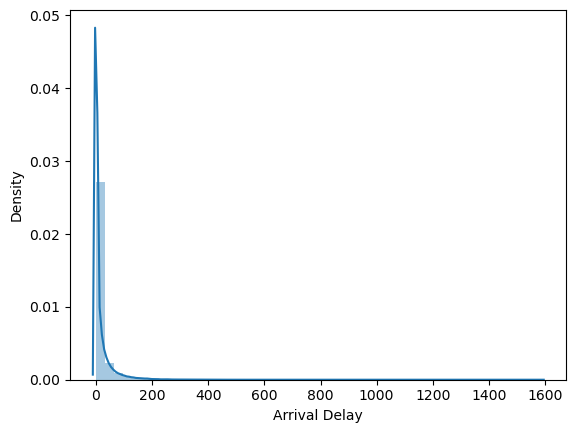

In [19]:
sns.distplot(df['Arrival Delay'])

In [20]:
med_val=df['Arrival Delay'].median()


In [21]:
df['Arrival Delay'].fillna(med_val,inplace=True)

In [22]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


<Axes: xlabel='Satisfaction', ylabel='count'>

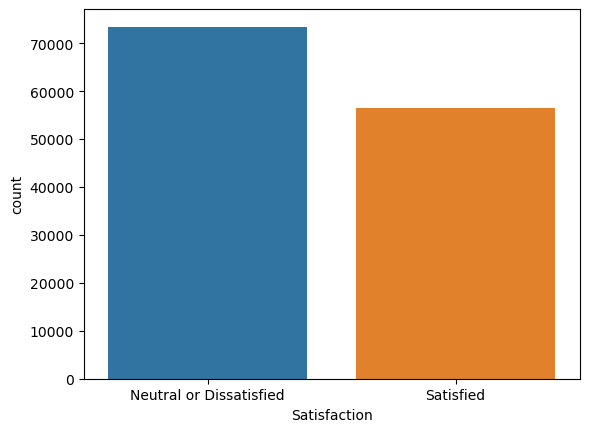

In [23]:
sns.countplot(x=df['Satisfaction'])

<Axes: xlabel='Satisfaction', ylabel='count'>

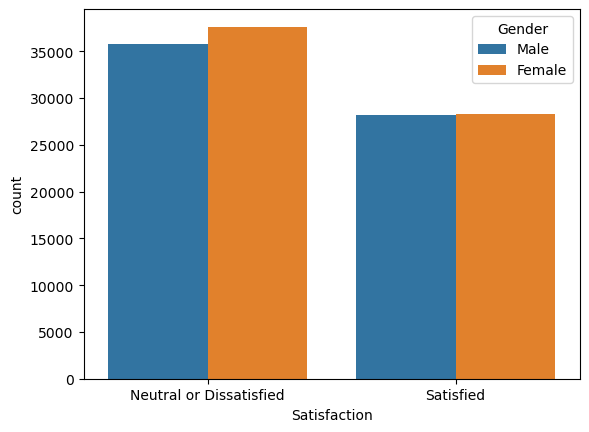

In [24]:
sns.countplot(x=df['Satisfaction'],hue=df['Gender'])

<Axes: xlabel='Satisfaction', ylabel='count'>

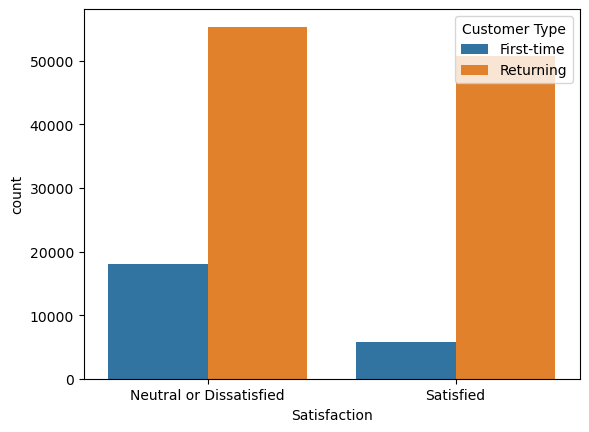

In [25]:
sns.countplot(x=df['Satisfaction'],hue=df['Customer Type'])

<Axes: xlabel='Satisfaction', ylabel='count'>

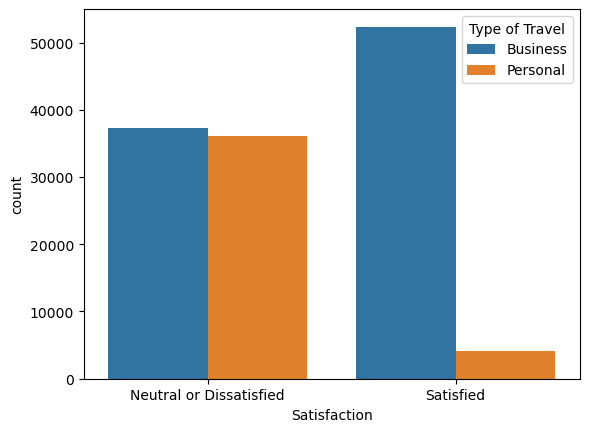

In [26]:
sns.countplot(x=df['Satisfaction'],hue=df['Type of Travel'])

<Axes: xlabel='Satisfaction', ylabel='count'>

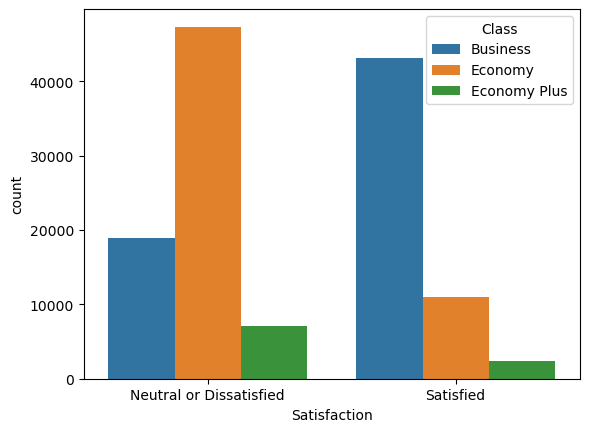

In [27]:
sns.countplot(x=df['Satisfaction'],hue=df['Class'])

<Axes: xlabel='Satisfaction', ylabel='count'>

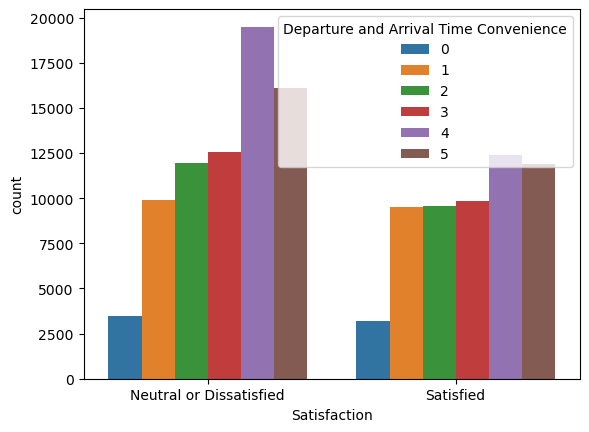

In [28]:
sns.countplot(x=df['Satisfaction'],hue=df['Departure and Arrival Time Convenience'])

<Axes: xlabel='Satisfaction', ylabel='count'>

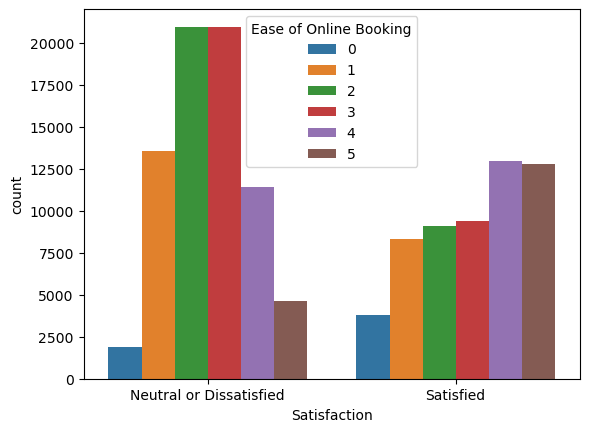

In [29]:
sns.countplot(x=df['Satisfaction'],hue=df['Ease of Online Booking'])

<Axes: xlabel='Satisfaction', ylabel='count'>

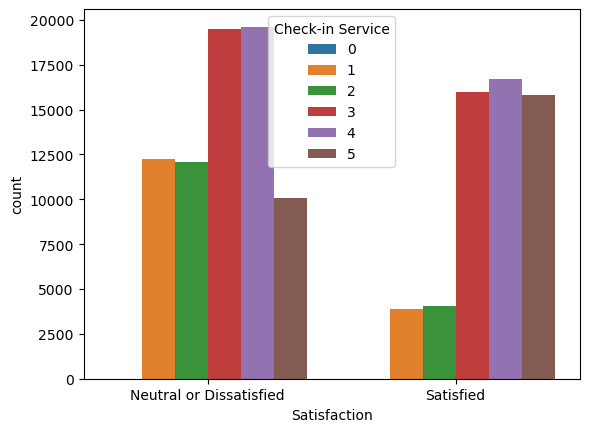

In [30]:
sns.countplot(x=df['Satisfaction'],hue=df['Check-in Service'])

<Axes: xlabel='Satisfaction', ylabel='count'>

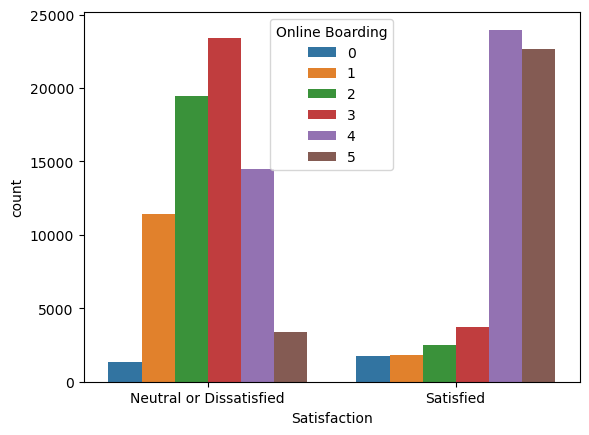

In [31]:
sns.countplot(x=df['Satisfaction'],hue=df['Online Boarding'])

<Axes: xlabel='Satisfaction', ylabel='count'>

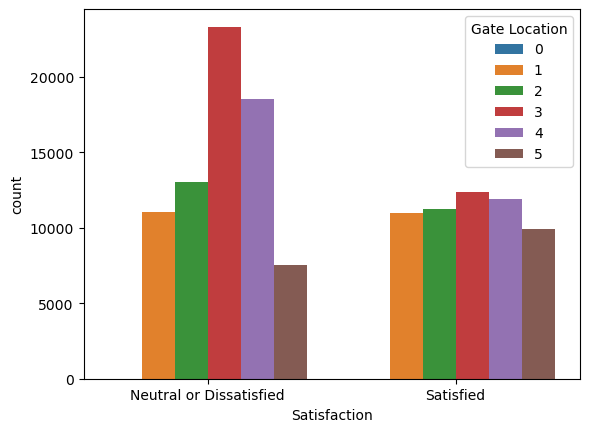

In [32]:

sns.countplot(x=df['Satisfaction'],hue=df['Gate Location'])

<Axes: xlabel='Satisfaction', ylabel='count'>

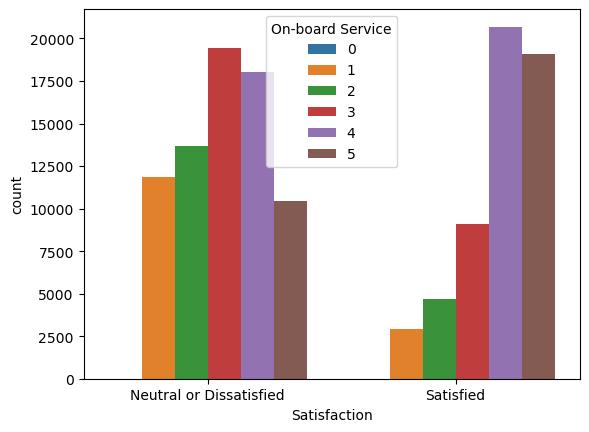

In [33]:

sns.countplot(x=df['Satisfaction'],hue=df['On-board Service'])

<Axes: xlabel='Satisfaction', ylabel='count'>

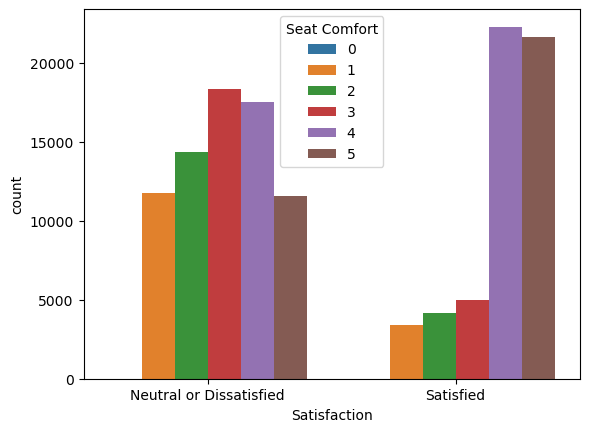

In [34]:
sns.countplot(x=df['Satisfaction'],hue=df['Seat Comfort'])

<Axes: xlabel='Satisfaction', ylabel='count'>

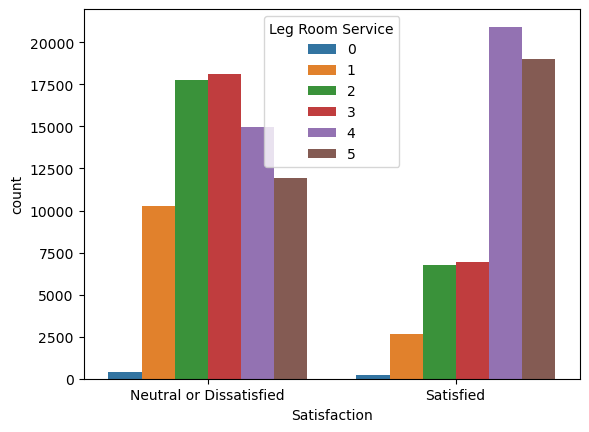

In [35]:

sns.countplot(x=df['Satisfaction'],hue=df['Leg Room Service'])

<Axes: xlabel='Satisfaction', ylabel='count'>

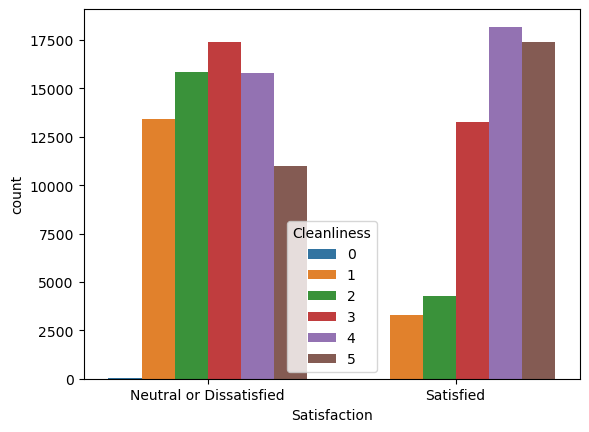

In [36]:


sns.countplot(x=df['Satisfaction'],hue=df['Cleanliness'])

<Axes: xlabel='Satisfaction', ylabel='count'>

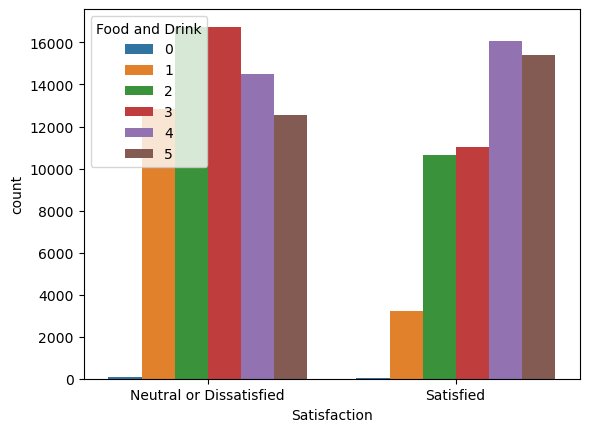

In [37]:
sns.countplot(x=df['Satisfaction'],hue=df['Food and Drink'])

<Axes: xlabel='Satisfaction', ylabel='count'>

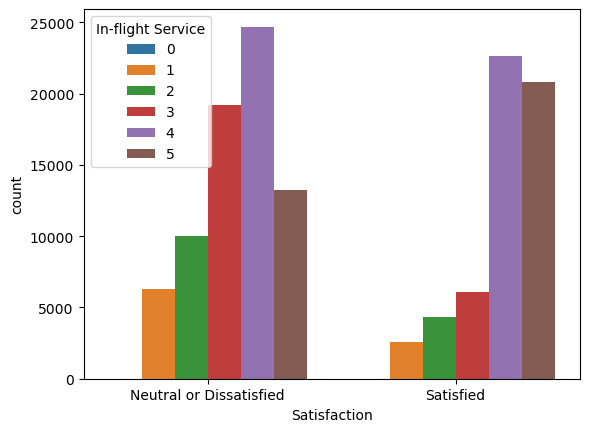

In [38]:

sns.countplot(x=df['Satisfaction'],hue=df['In-flight Service'])

<Axes: xlabel='Satisfaction', ylabel='count'>

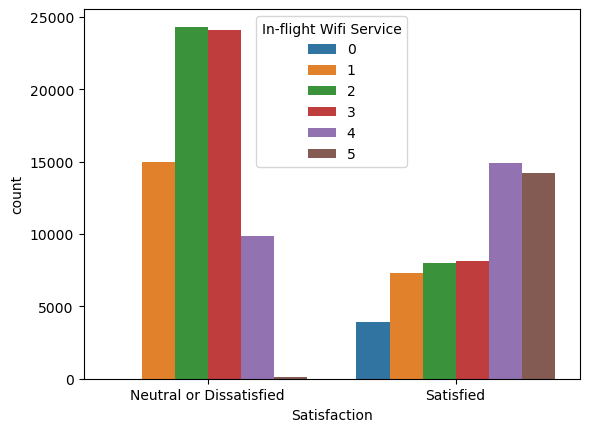

In [39]:
sns.countplot(x=df['Satisfaction'],hue=df['In-flight Wifi Service'])

<Axes: xlabel='Satisfaction', ylabel='count'>

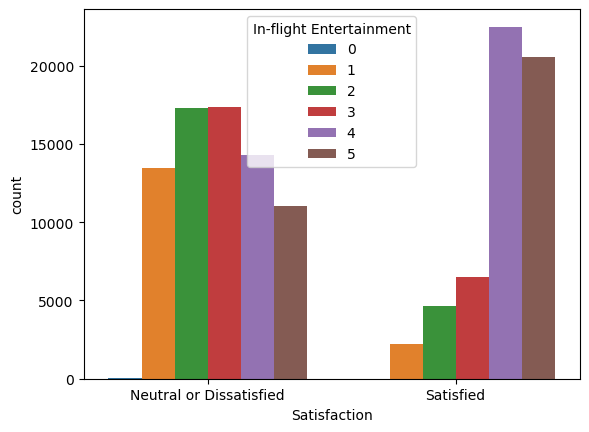

In [40]:

sns.countplot(x=df['Satisfaction'],hue=df['In-flight Entertainment'])

<Axes: xlabel='Satisfaction', ylabel='count'>

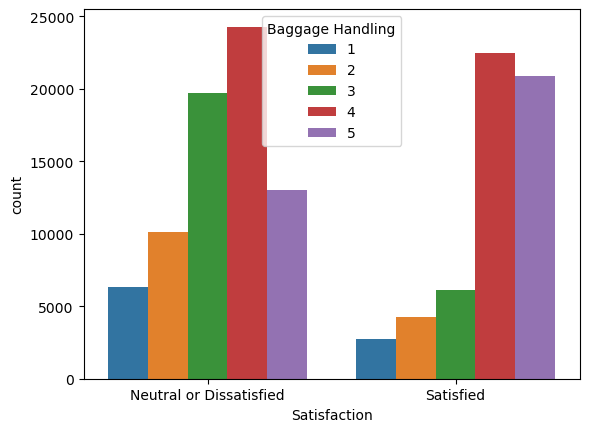

In [41]:
sns.countplot(x=df['Satisfaction'],hue=df['Baggage Handling'])

In [42]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


<Axes: xlabel='Satisfaction', ylabel='Age'>

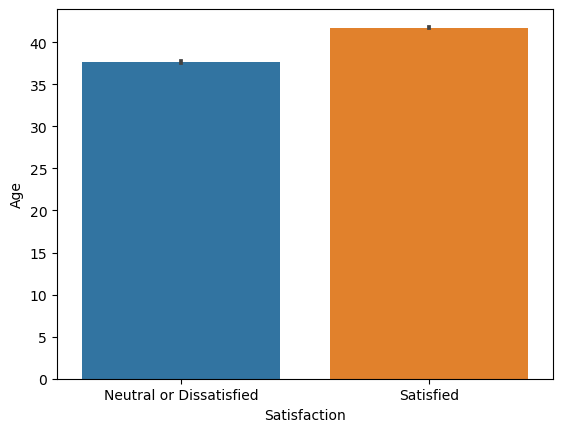

In [43]:
sns.barplot(x=df['Satisfaction'],y=df['Age'])

<Axes: xlabel='Satisfaction', ylabel='Flight Distance'>

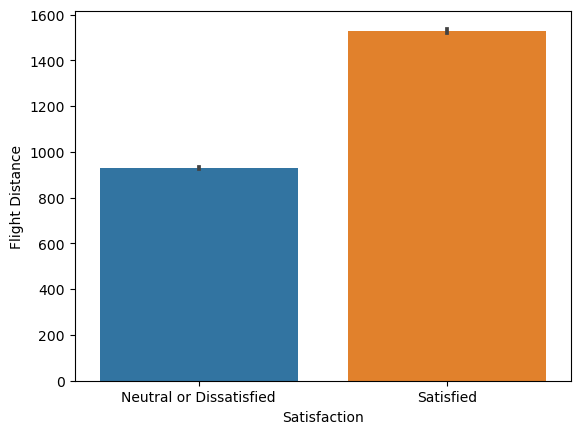

In [44]:
sns.barplot(x=df['Satisfaction'],y=df['Flight Distance'])

<Axes: xlabel='Satisfaction', ylabel='Departure Delay'>

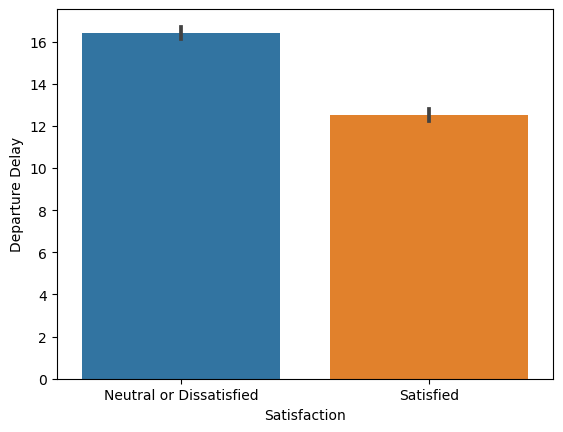

In [45]:
sns.barplot(x=df['Satisfaction'],y=df['Departure Delay'])

<Axes: xlabel='Satisfaction', ylabel='Arrival Delay'>

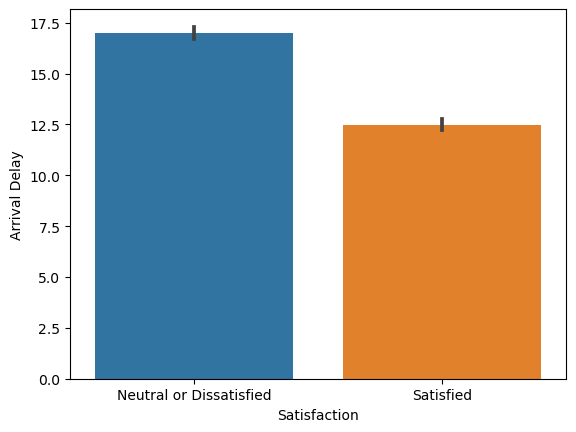

In [46]:
sns.barplot(x=df['Satisfaction'],y=df['Arrival Delay'])

<Axes: xlabel='Satisfaction', ylabel='Departure and Arrival Time Convenience'>

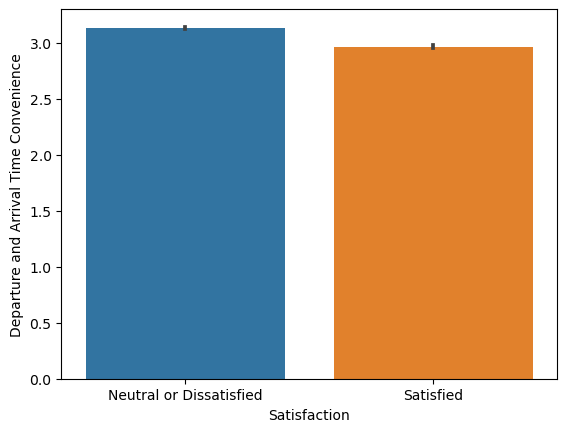

In [47]:
sns.barplot(x=df['Satisfaction'],y=df['Departure and Arrival Time Convenience'])

<Axes: xlabel='Satisfaction', ylabel='On-board Service'>

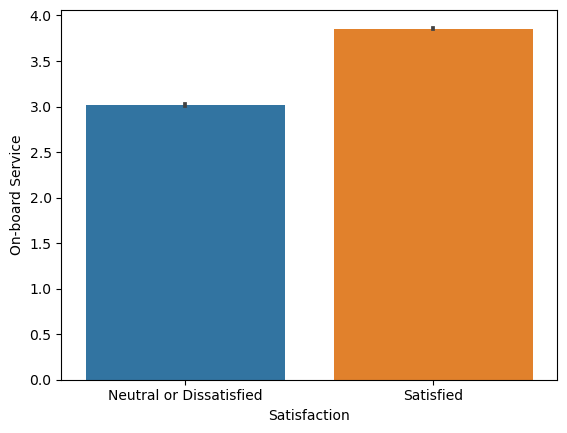

In [48]:
sns.barplot(x=df['Satisfaction'],y=df['On-board Service'])

<Axes: xlabel='Satisfaction', ylabel='Ease of Online Booking'>

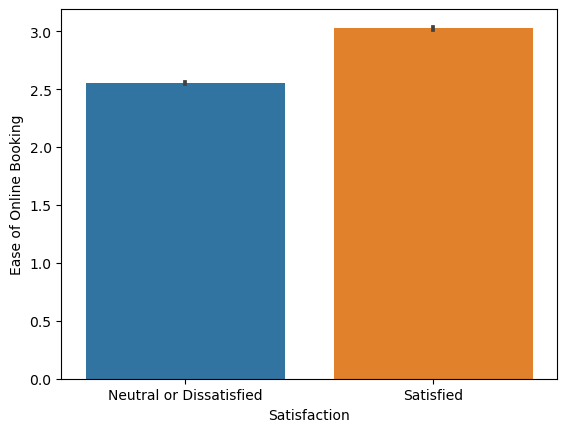

In [49]:
sns.barplot(x=df['Satisfaction'],y=df['Ease of Online Booking'])

<Axes: xlabel='Satisfaction', ylabel='Seat Comfort'>

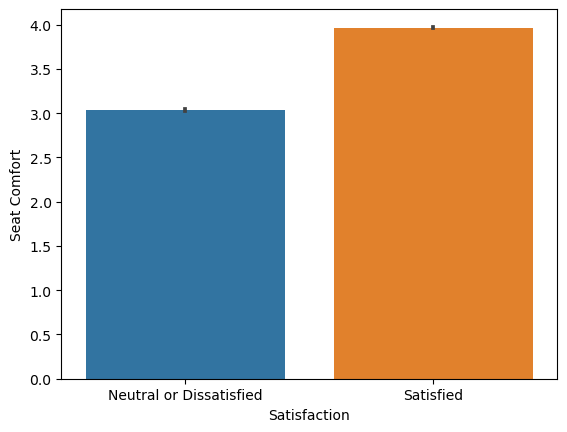

In [50]:
sns.barplot(x=df['Satisfaction'],y=df['Seat Comfort'])

<Axes: xlabel='Satisfaction', ylabel='Leg Room Service'>

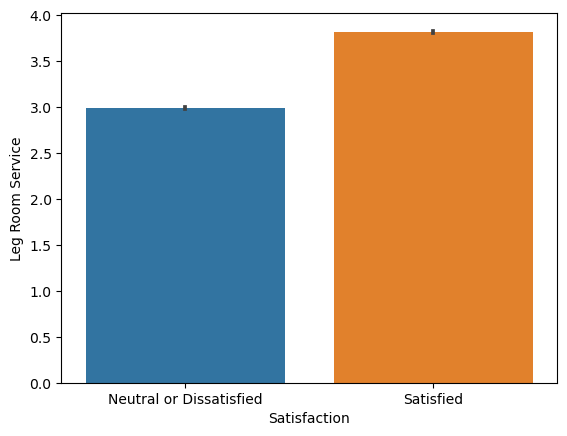

In [51]:
sns.barplot(x=df['Satisfaction'],y=df['Leg Room Service'])

<Axes: xlabel='Satisfaction', ylabel='Cleanliness'>

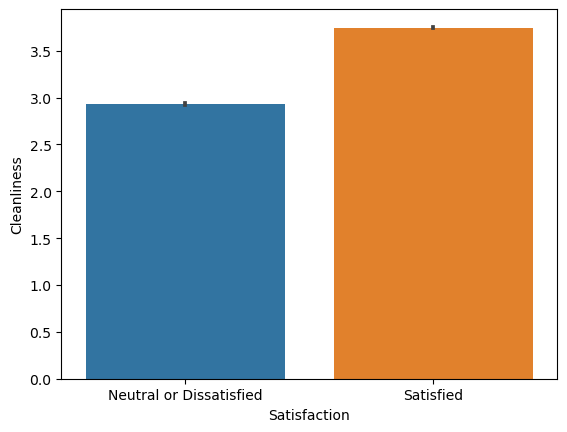

In [52]:
sns.barplot(x=df['Satisfaction'],y=df['Cleanliness'])

<Axes: xlabel='Satisfaction', ylabel='Food and Drink'>

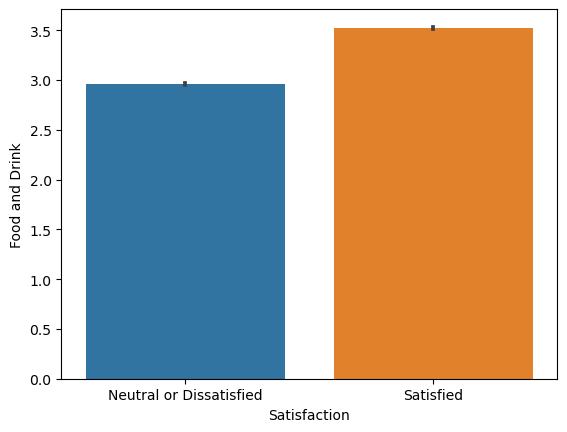

In [53]:
sns.barplot(x=df['Satisfaction'],y=df['Food and Drink'])

<Axes: xlabel='Satisfaction', ylabel='In-flight Service'>

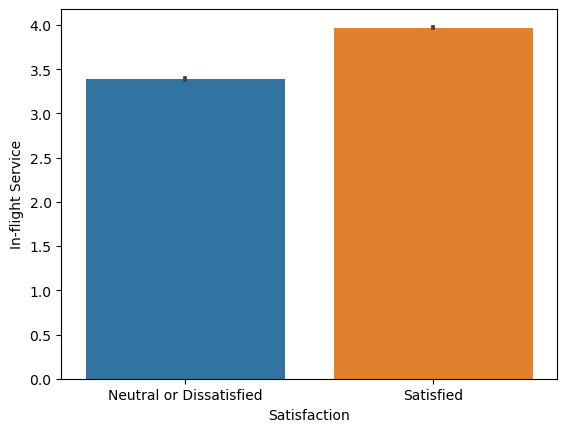

In [54]:
sns.barplot(x=df['Satisfaction'],y=df['In-flight Service'])

<Axes: xlabel='Satisfaction', ylabel='In-flight Wifi Service'>

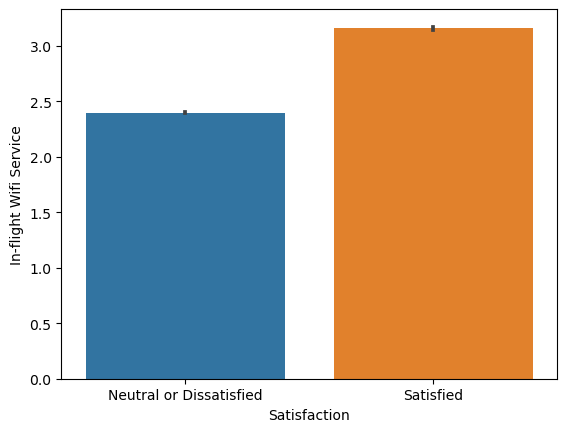

In [55]:
sns.barplot(x=df['Satisfaction'],y=df['In-flight Wifi Service'])

<Axes: xlabel='Satisfaction', ylabel='In-flight Entertainment'>

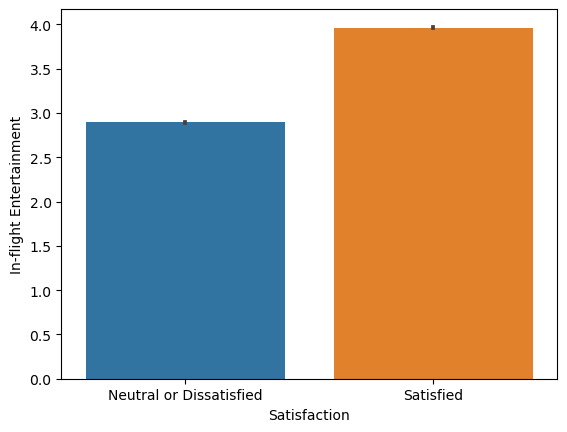

In [56]:
sns.barplot(x=df['Satisfaction'],y=df['In-flight Entertainment'])

<Axes: xlabel='Satisfaction', ylabel='Baggage Handling'>

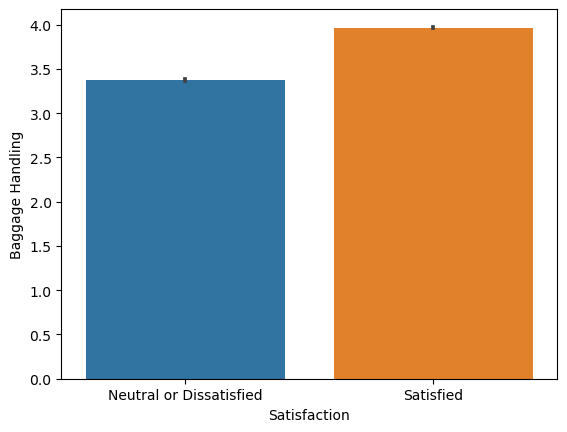

In [57]:
sns.barplot(x=df['Satisfaction'],y=df['Baggage Handling'])

In [58]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


<Axes: xlabel='Satisfaction', ylabel='Age'>

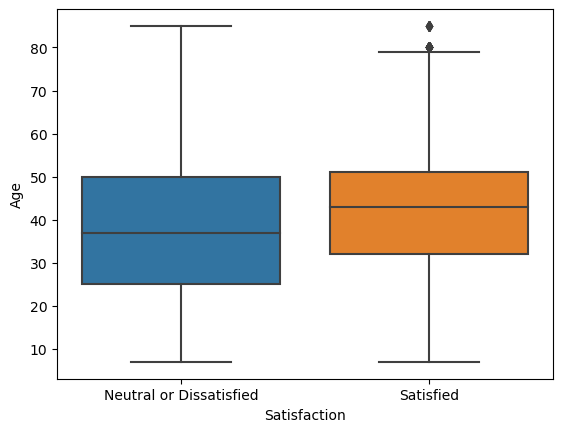

In [59]:
sns.boxplot(x=df['Satisfaction'],y=df['Age'])

<Axes: xlabel='Satisfaction', ylabel='Flight Distance'>

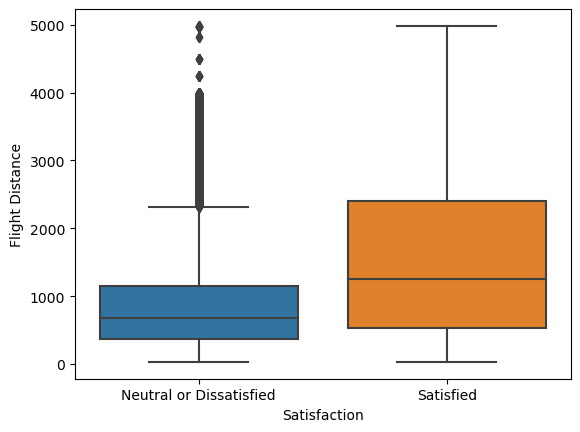

In [60]:
sns.boxplot(x=df['Satisfaction'],y=df['Flight Distance'])

<Axes: xlabel='Satisfaction', ylabel='Departure Delay'>

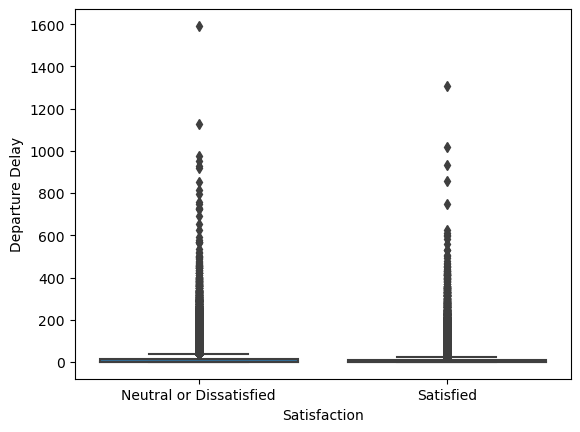

In [61]:

sns.boxplot(x=df['Satisfaction'],y=df['Departure Delay'])

<Axes: xlabel='Satisfaction', ylabel='Arrival Delay'>

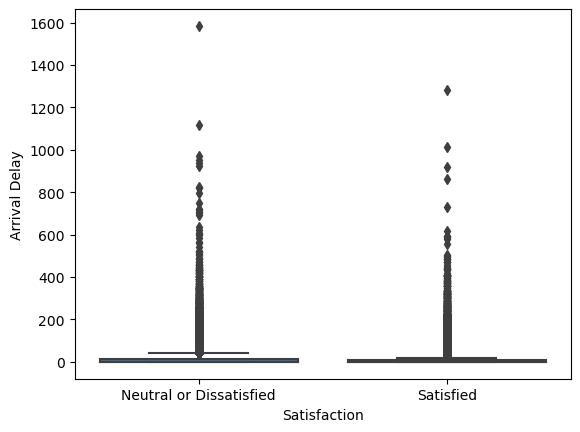

In [62]:
sns.boxplot(x=df['Satisfaction'],y=df['Arrival Delay'])

<Axes: xlabel='Satisfaction', ylabel='Departure and Arrival Time Convenience'>

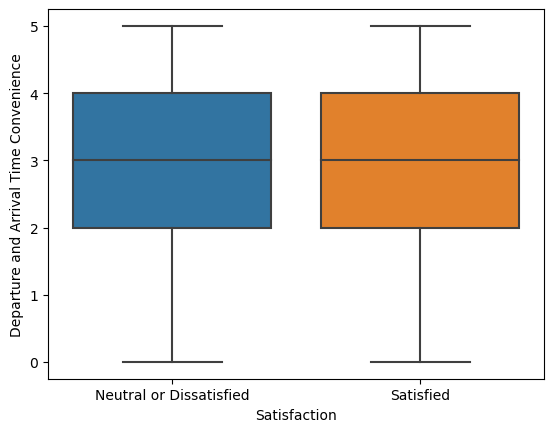

In [63]:
sns.boxplot(x=df['Satisfaction'],y=df['Departure and Arrival Time Convenience'])

<Axes: xlabel='Satisfaction', ylabel='On-board Service'>

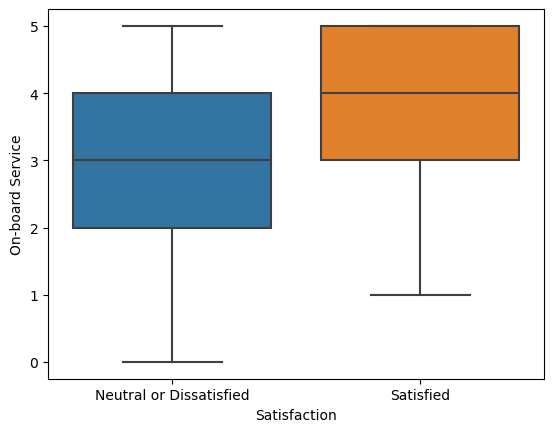

In [64]:
sns.boxplot(x=df['Satisfaction'],y=df['On-board Service'])

<Axes: xlabel='Satisfaction', ylabel='Ease of Online Booking'>

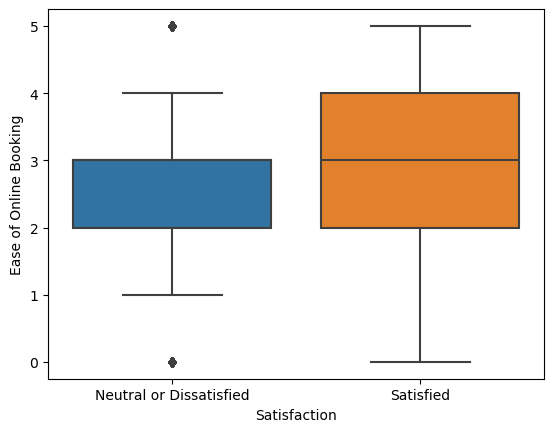

In [65]:
sns.boxplot(x=df['Satisfaction'],y=df['Ease of Online Booking'])

<Axes: xlabel='Satisfaction', ylabel='Seat Comfort'>

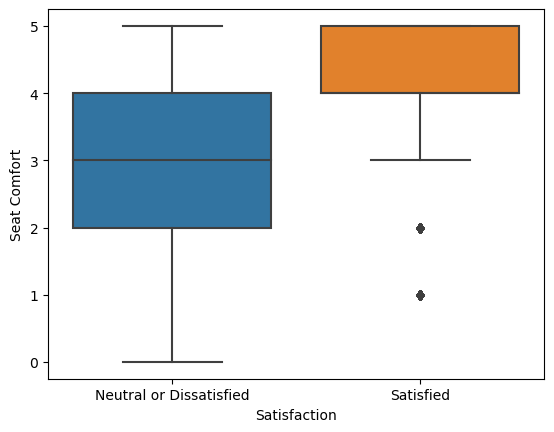

In [66]:
sns.boxplot(x=df['Satisfaction'],y=df['Seat Comfort'])

<Axes: xlabel='Satisfaction', ylabel='Leg Room Service'>

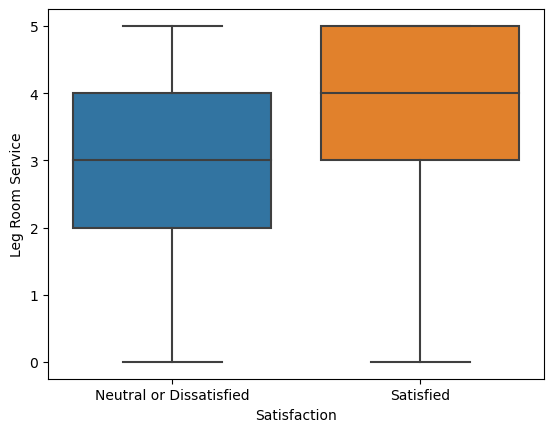

In [67]:
sns.boxplot(x=df['Satisfaction'],y=df['Leg Room Service'])

<Axes: xlabel='Satisfaction', ylabel='Cleanliness'>

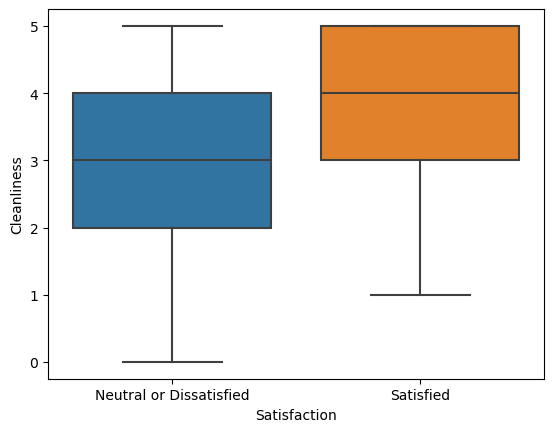

In [68]:
sns.boxplot(x=df['Satisfaction'],y=df['Cleanliness'])

<Axes: xlabel='Satisfaction', ylabel='Food and Drink'>

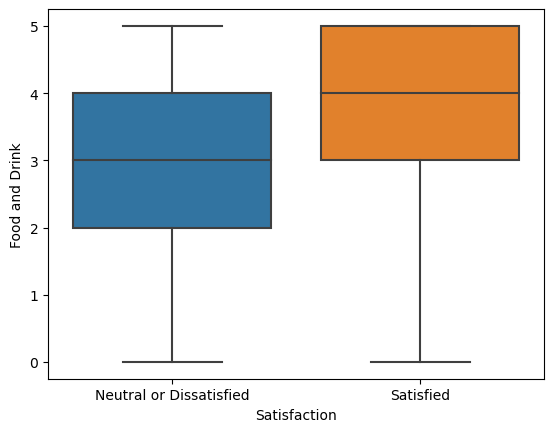

In [69]:
sns.boxplot(x=df['Satisfaction'],y=df['Food and Drink'])

<Axes: xlabel='Satisfaction', ylabel='In-flight Service'>

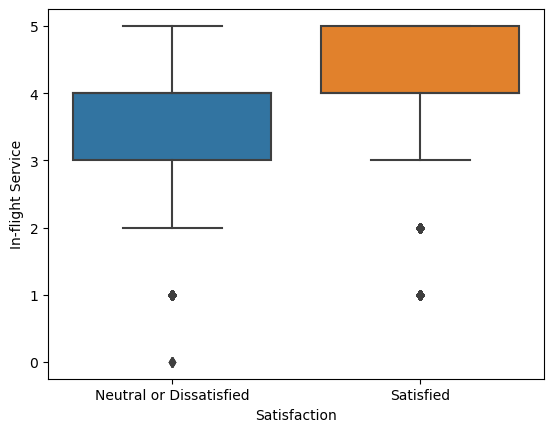

In [70]:
sns.boxplot(x=df['Satisfaction'],y=df['In-flight Service'])

<Axes: xlabel='Satisfaction', ylabel='In-flight Wifi Service'>

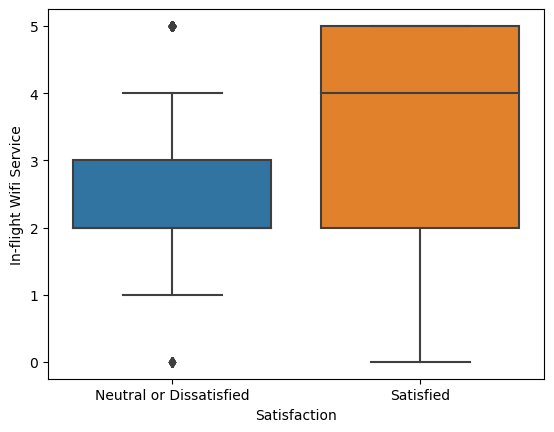

In [71]:
sns.boxplot(x=df['Satisfaction'],y=df['In-flight Wifi Service'])

<Axes: xlabel='Satisfaction', ylabel='In-flight Entertainment'>

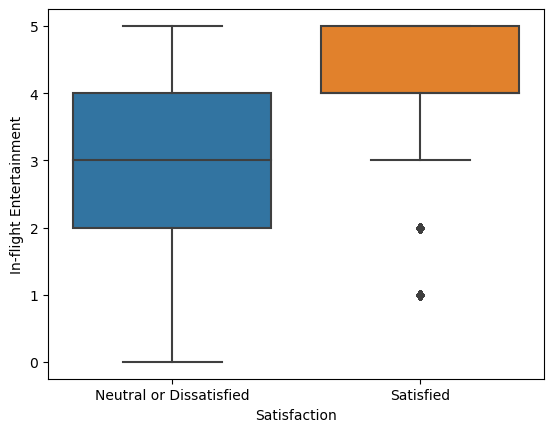

In [72]:
sns.boxplot(x=df['Satisfaction'],y=df['In-flight Entertainment'])

<Axes: xlabel='Satisfaction', ylabel='Baggage Handling'>

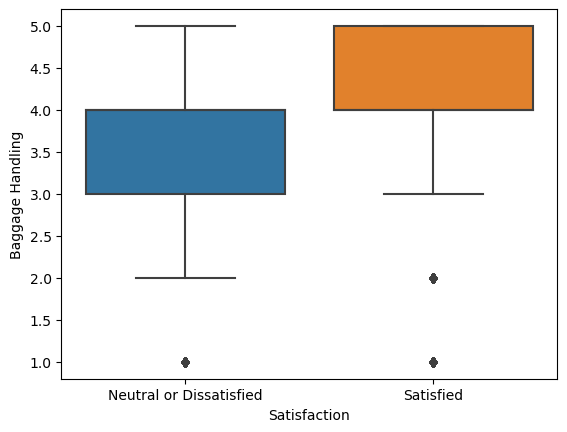

In [73]:
sns.boxplot(x=df['Satisfaction'],y=df['Baggage Handling'])

In [74]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [75]:
label_df=df.groupby(df['Type of Travel'])['Satisfaction'].count().index


In [76]:
val_df=df.groupby(df['Type of Travel'])['Satisfaction'].count().values


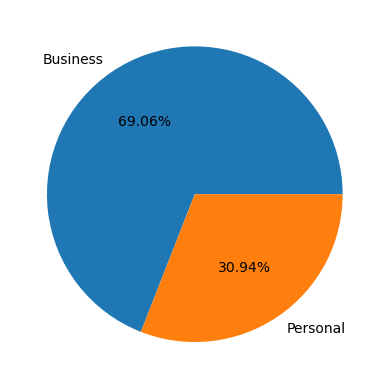

In [77]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [78]:
label_df=df.groupby(df['Class'])['Satisfaction'].count().index


In [79]:
val_df=df.groupby(df['Class'])['Satisfaction'].count().values


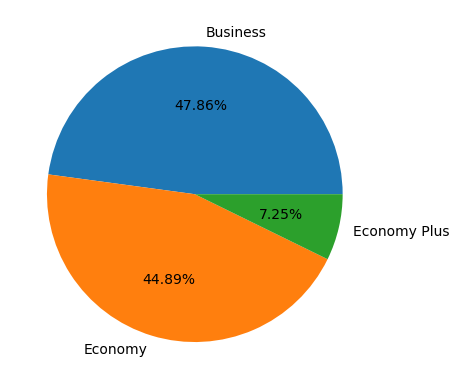

In [80]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [81]:
label_df=df.groupby(df['Customer Type'])['Satisfaction'].count().index


In [82]:
val_df=df.groupby(df['Customer Type'])['Satisfaction'].count().values


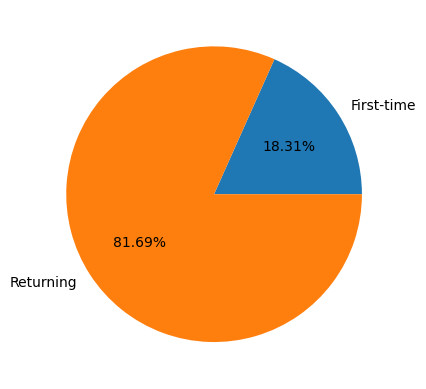

In [83]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [84]:
label_df=df.groupby(df['Gender'])['Satisfaction'].count().index


In [85]:
val_df=df.groupby(df['Gender'])['Satisfaction'].count().values


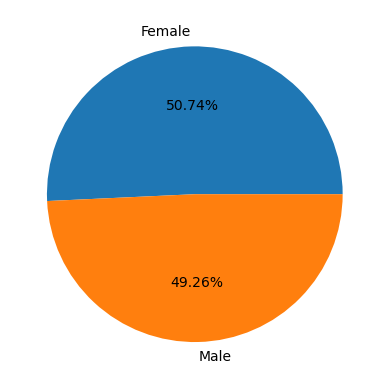

In [86]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [87]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [88]:
label_df=df.groupby(df['Satisfaction'])['Flight Distance'].mean().index


In [89]:
val_df=df.groupby(df['Satisfaction'])['Flight Distance'].mean().values


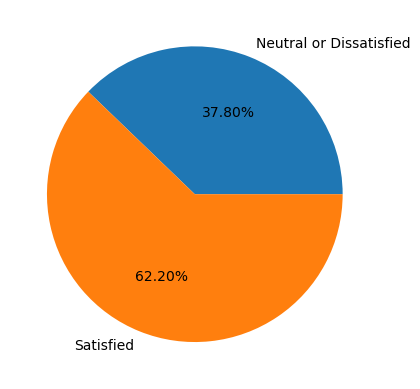

In [90]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [91]:
label_df=df.groupby(df['Satisfaction'])['Arrival Delay'].mean().index


In [92]:
val_df=df.groupby(df['Satisfaction'])['Arrival Delay'].mean().values


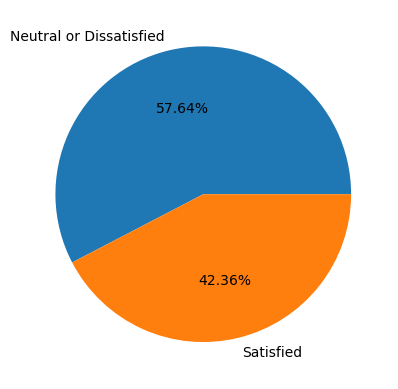

In [93]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [94]:
label_df=df.groupby(df['Satisfaction'])['Departure Delay'].mean().index


In [95]:
val_df=df.groupby(df['Satisfaction'])['Departure Delay'].mean().values


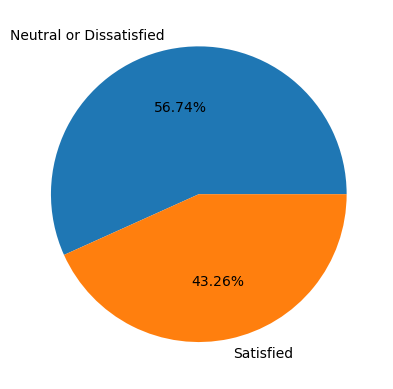

In [96]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [97]:
label_df=df.groupby(df['Satisfaction'])['Age'].mean().index


In [98]:
val_df=df.groupby(df['Satisfaction'])['Age'].mean().values


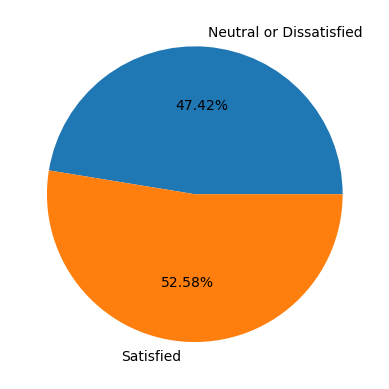

In [99]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [100]:
label_df=df.groupby(df['Satisfaction'])['Food and Drink'].mean().index


In [101]:
val_df=df.groupby(df['Satisfaction'])['Food and Drink'].mean().values


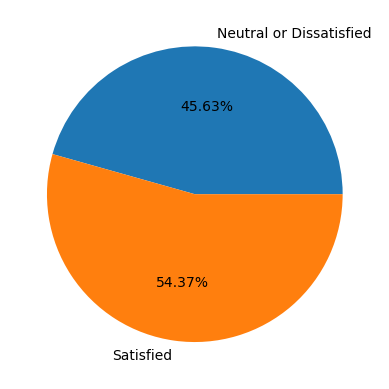

In [102]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [103]:
label_df=df.groupby(df['Satisfaction'])['In-flight Entertainment'].mean().index


In [104]:
val_df=df.groupby(df['Satisfaction'])['In-flight Entertainment'].mean().values


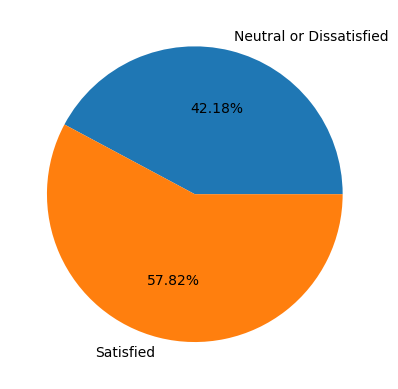

In [105]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [106]:
label_df=df.groupby(df['Satisfaction'])['Cleanliness'].mean().index


In [107]:
val_df=df.groupby(df['Satisfaction'])['Cleanliness'].mean().values


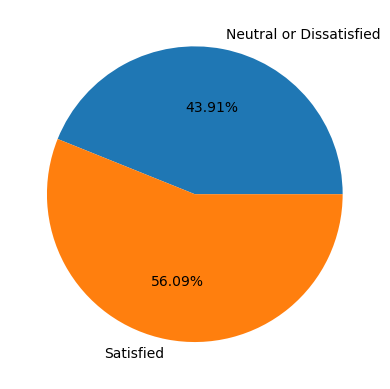

In [108]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [109]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [110]:
label_df=df.groupby(['Gender','Satisfaction'])['Flight Distance'].mean().index


In [111]:
val_df=df.groupby(['Gender','Satisfaction'])['Flight Distance'].mean().values


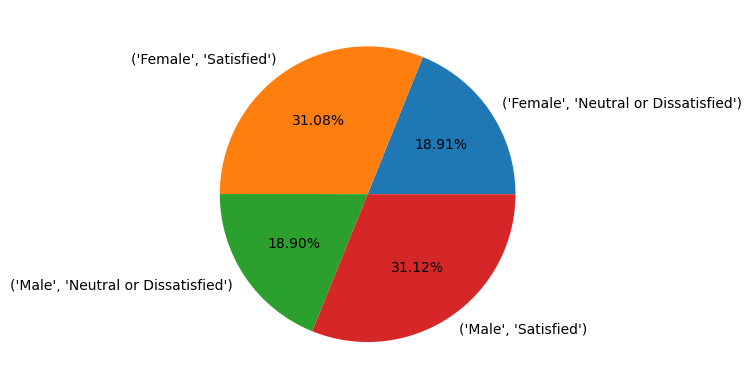

In [112]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [113]:
label_df=df.groupby(['Satisfaction','Class'])['Flight Distance'].mean().index


In [114]:
val_df=df.groupby(['Satisfaction','Class'])['Flight Distance'].mean().values


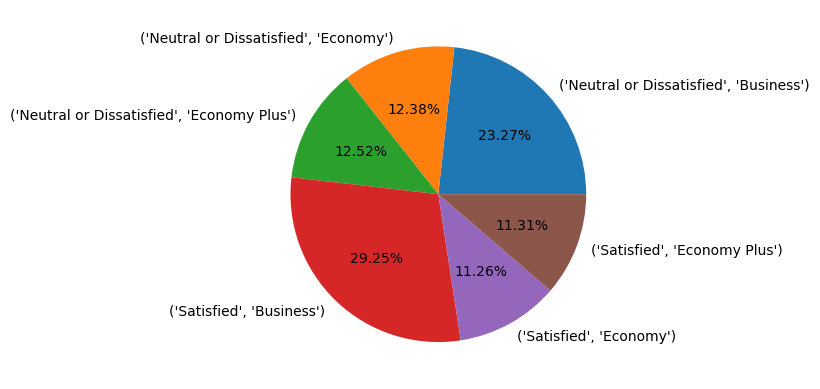

In [115]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [116]:
label_df=df.groupby(['Satisfaction','Type of Travel'])['Flight Distance'].mean().index


In [117]:
val_df=df.groupby(['Satisfaction','Type of Travel'])['Flight Distance'].mean().values


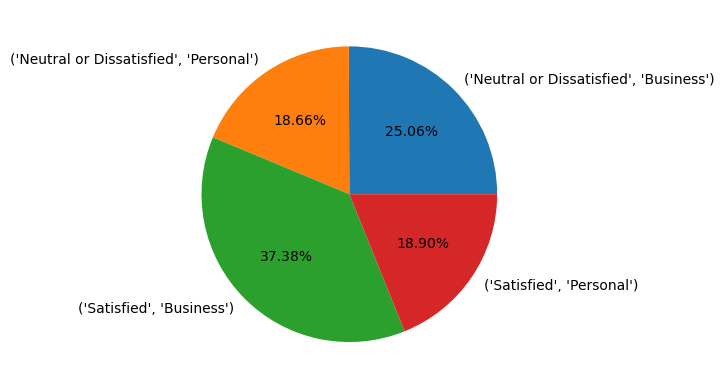

In [118]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [119]:
label_df=df.groupby(['Satisfaction','Customer Type'])['Flight Distance'].mean().index


In [120]:
val_df=df.groupby(['Satisfaction','Customer Type'])['Flight Distance'].mean().values


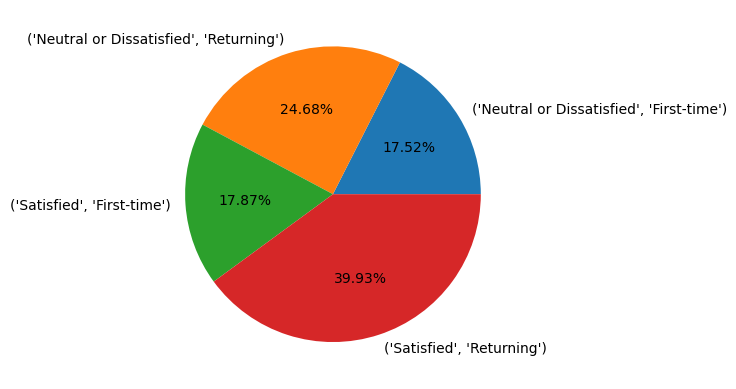

In [121]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [122]:
label_df=df.groupby(['Satisfaction','Customer Type','Gender'])['Flight Distance'].mean().index


In [123]:
val_df=df.groupby(['Satisfaction','Customer Type','Gender'])['Flight Distance'].mean().values


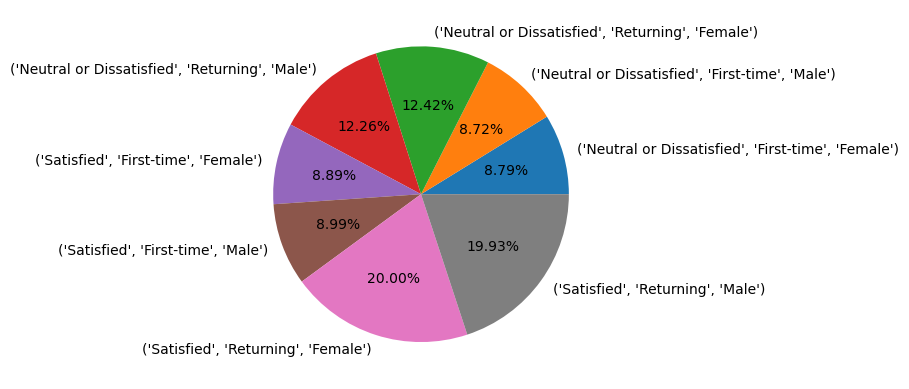

In [124]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [125]:
label_df=df.groupby(['Satisfaction','Type of Travel','Gender'])['Flight Distance'].mean().index


In [126]:
val_df=df.groupby(['Satisfaction','Type of Travel','Gender'])['Flight Distance'].mean().values


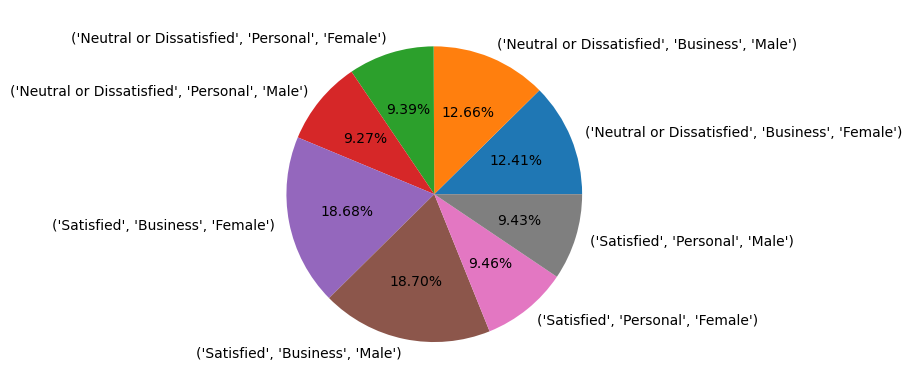

In [127]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [128]:
label_df=df.groupby(['Satisfaction','Type of Travel','Class'])['Flight Distance'].mean().index


In [129]:
val_df=df.groupby(['Satisfaction','Type of Travel','Class'])['Flight Distance'].mean().values


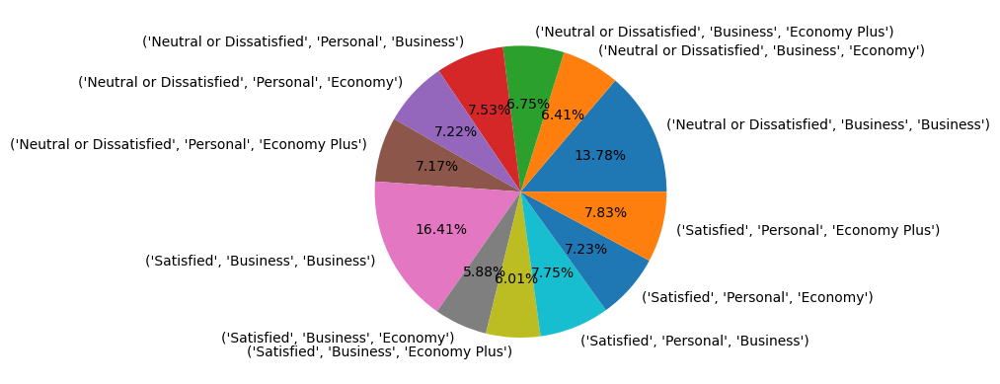

In [130]:
plt.pie(x=val_df,labels=label_df,autopct="%1.2f%%")
plt.show()

In [131]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [132]:
number_df=df.select_dtypes(include='number')


In [133]:
number_df

,ID,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
0,1,48,821,2,5.0,3,3,4,3,3,3,5,2,5,5,5,3,5,5
1,2,35,821,26,39.0,2,2,3,5,2,5,4,5,5,3,5,2,5,5
2,3,41,853,0,0.0,4,4,4,5,4,3,5,3,5,5,3,4,3,3
3,4,50,1905,0,0.0,2,2,3,4,2,5,5,5,4,4,5,2,5,5
4,5,49,3470,0,1.0,3,3,3,5,3,3,4,4,5,4,3,3,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,28,447,2,3.0,4,4,4,4,2,5,1,4,4,4,5,4,4,4
129876,129877,41,308,0,0.0,5,3,5,3,4,5,2,5,2,2,4,3,2,5
129877,129878,42,337,6,14.0,5,2,4,2,1,3,3,4,3,3,4,2,3,5
129878,129879,50,337,31,22.0,4,4,3,4,1,4,4,5,3,3,4,5,3,5


C:\Users\himan\AppData\Local\Temp\ipykernel_23616\2624485059.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\himan\AppData\Local\Temp\ipykernel_23616\2624485059.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or 

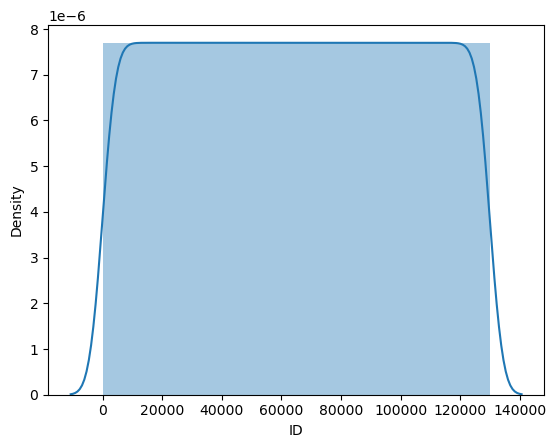

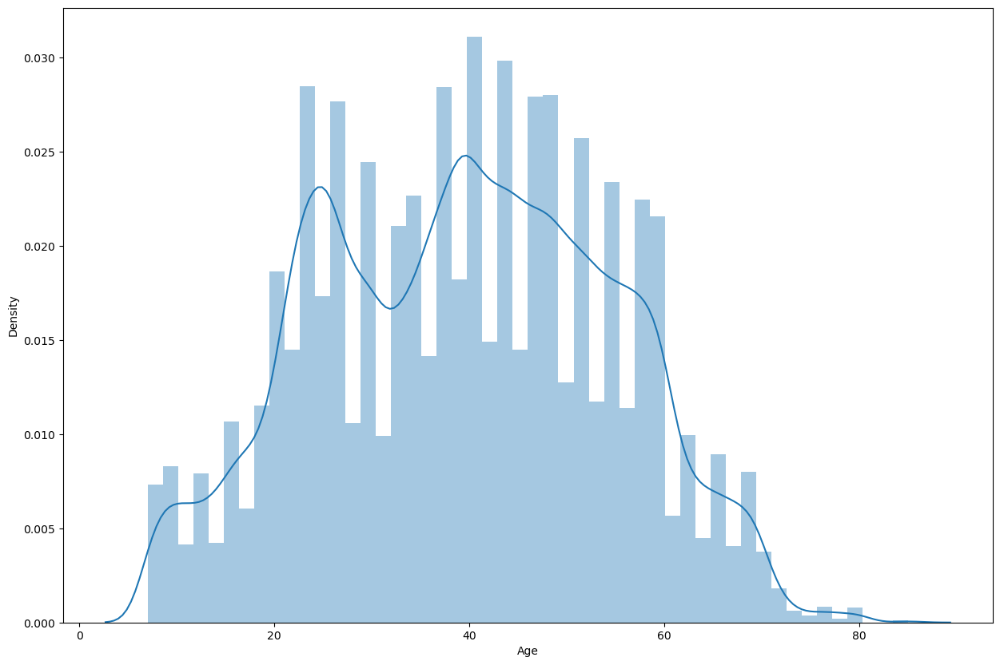

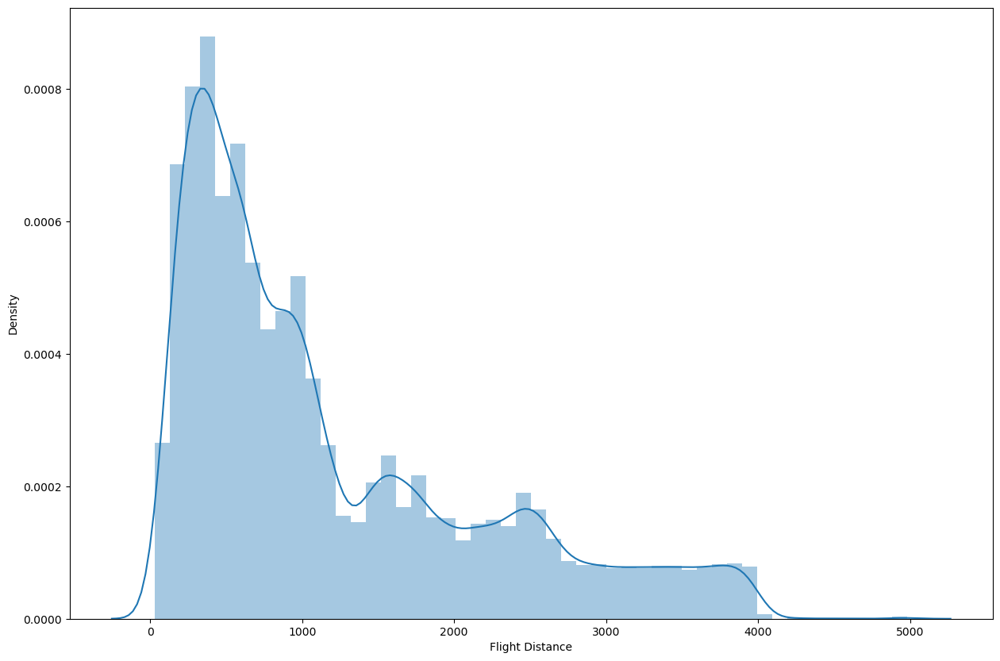

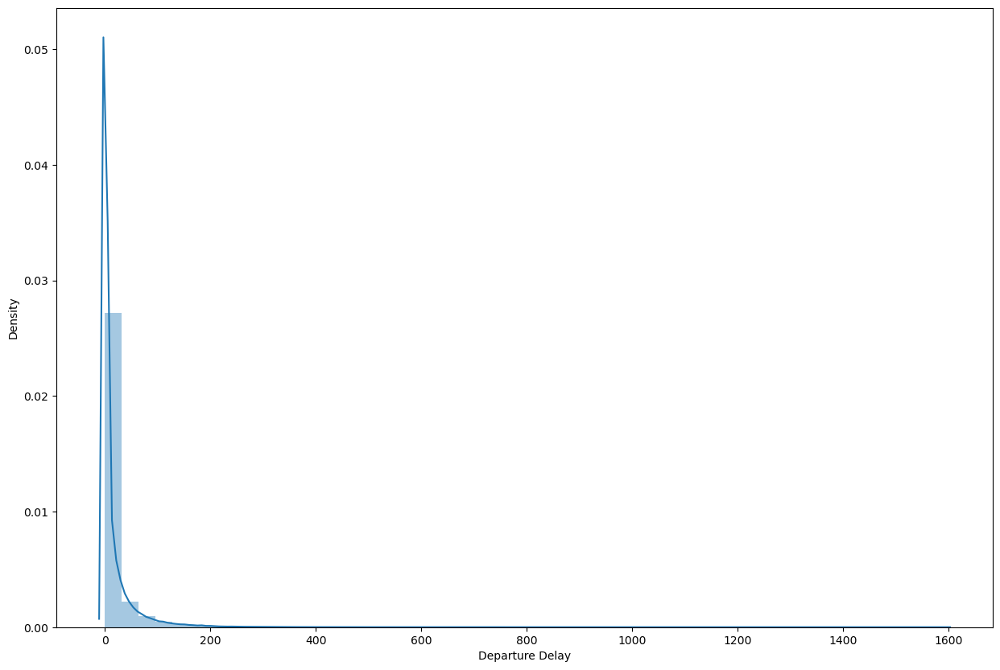

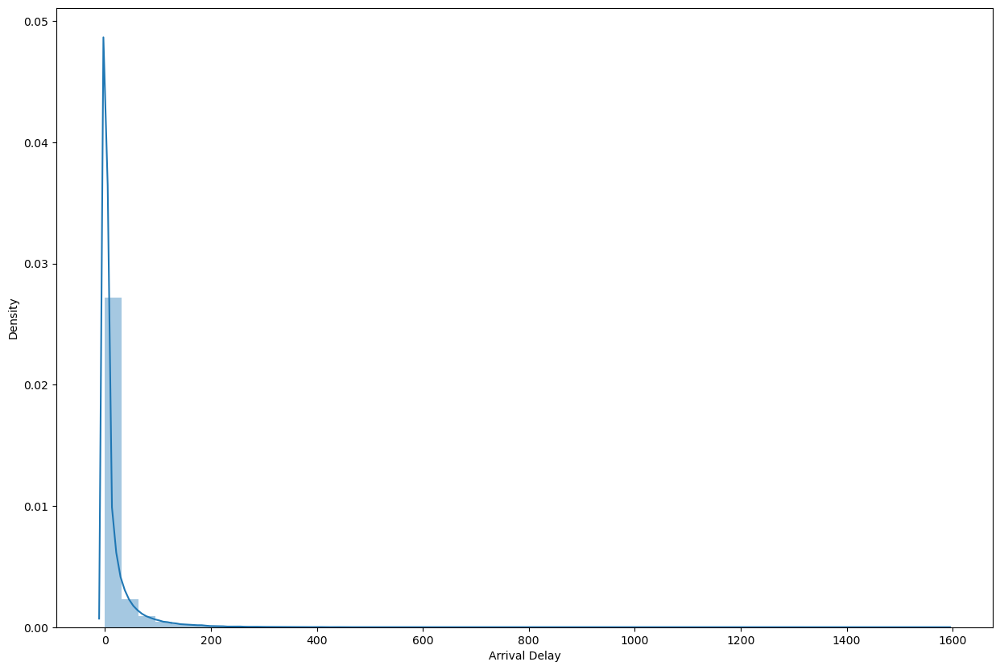

...

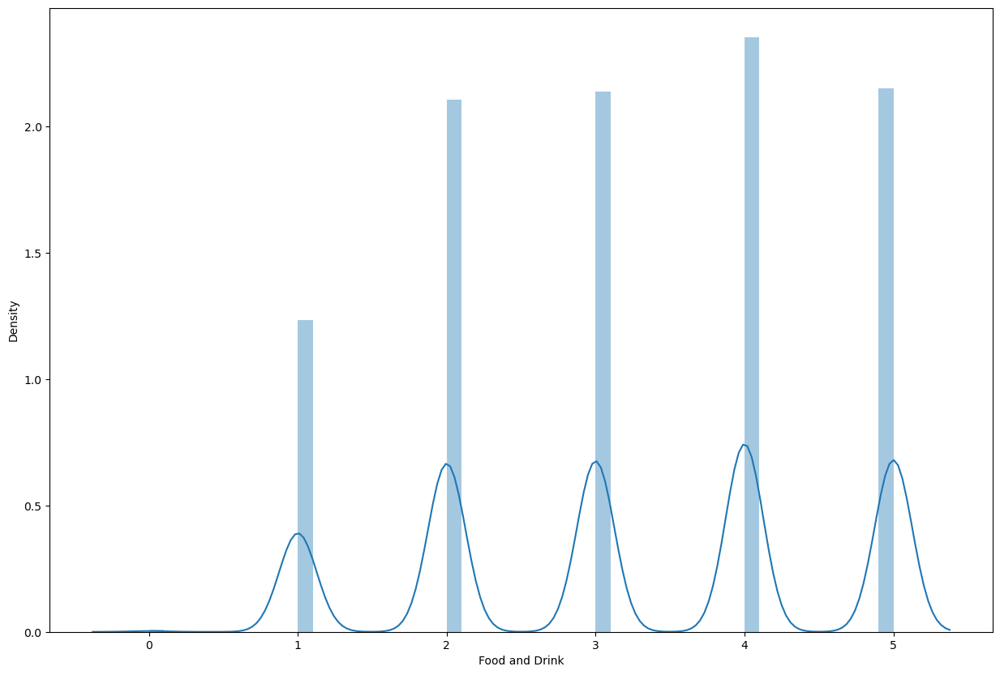

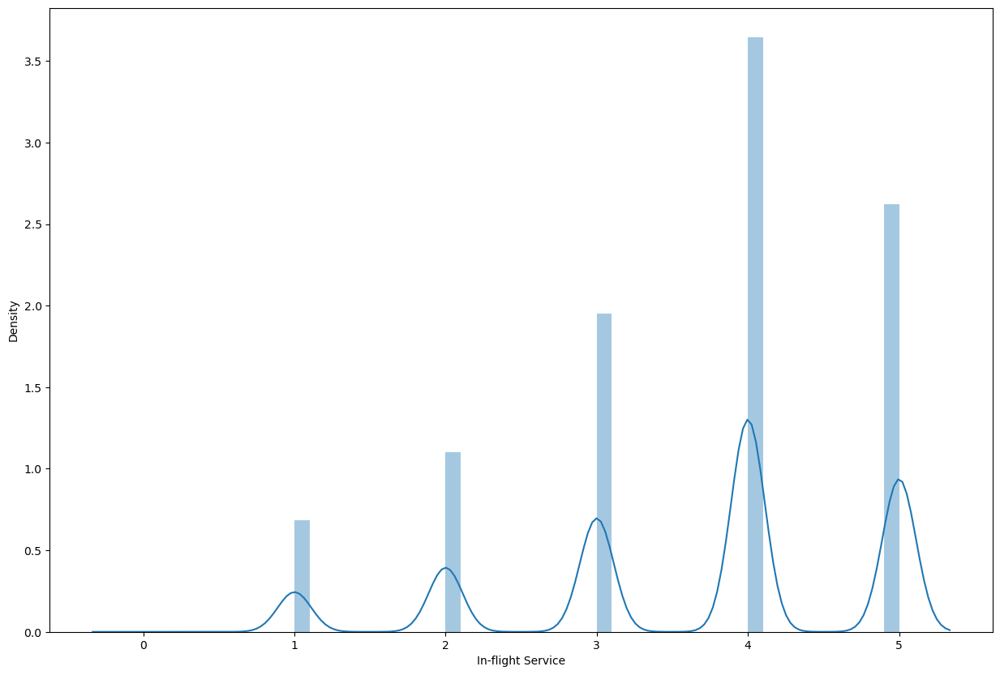

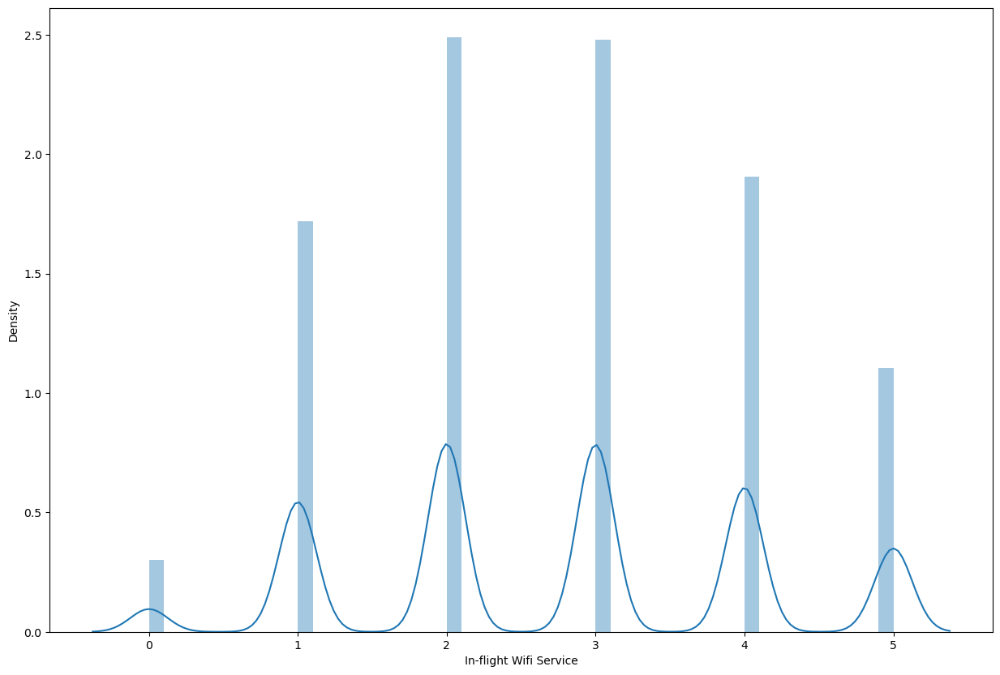

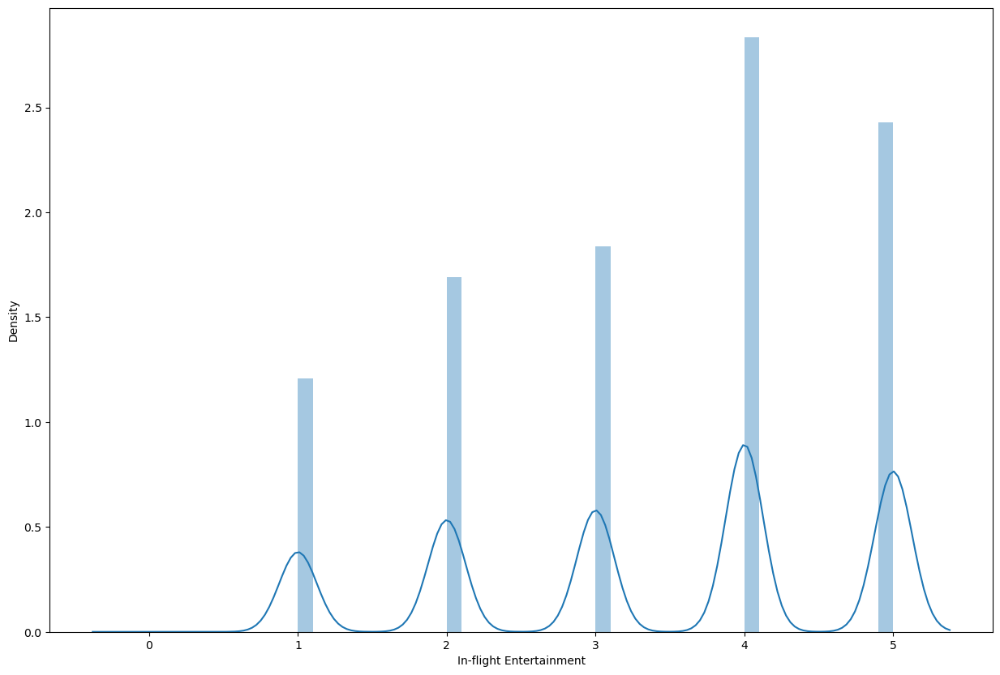

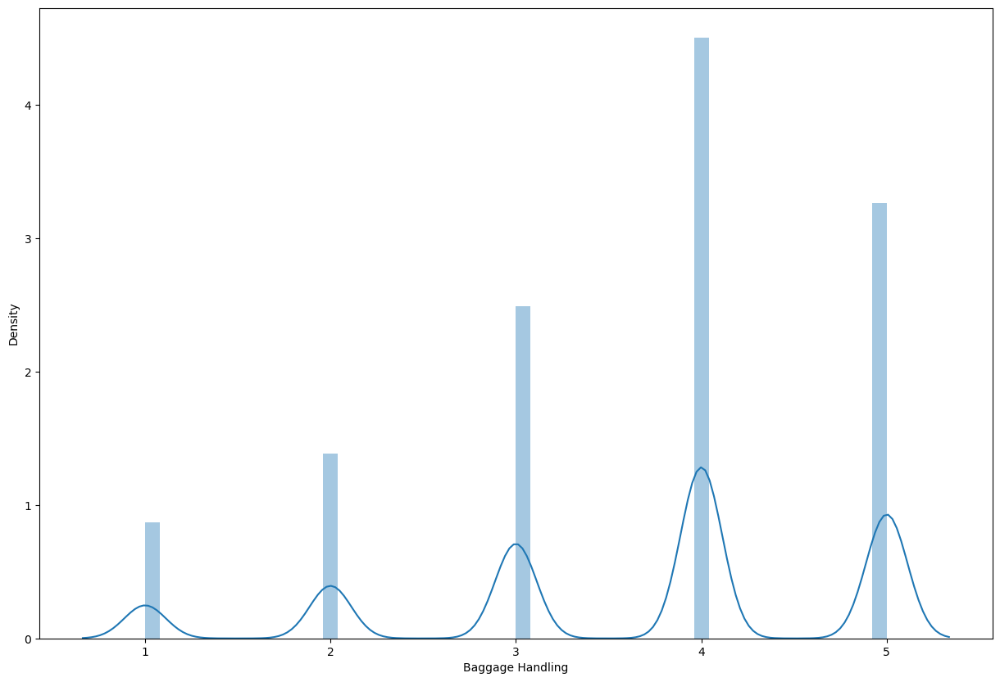

<Figure size 1500x1000 with 0 Axes>

In [134]:
for col in number_df:
    sns.distplot(df[col])
    plt.figure(figsize=(15,10))

In [135]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [136]:
df['Departure Delay']=np.log(df['Departure Delay'])


C:\Users\himan\anaconda3\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [137]:
df['Arrival Delay']=np.log(df['Arrival Delay'])

In [138]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,0.693147,1.609438,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,3.258097,3.663562,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,-inf,-inf,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,-inf,-inf,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,-inf,0.000000,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,0.693147,1.098612,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,-inf,-inf,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,1.791759,2.639057,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,3.433987,3.091042,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [139]:
df=df[df['Arrival Delay']>0]



C:\Users\himan\AppData\Local\Temp\ipykernel_23616\2862034384.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Arrival Delay'])
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Arrival Delay', ylabel='Density'>

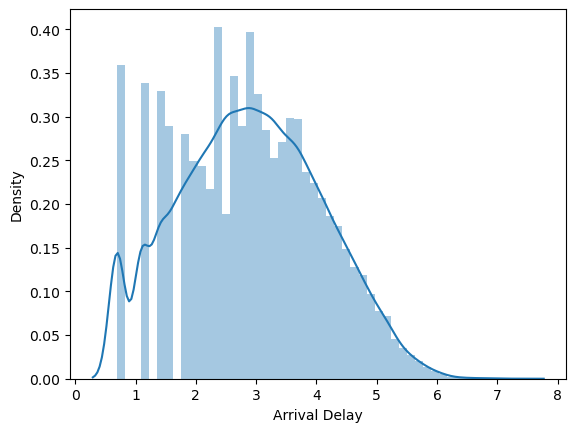

In [140]:
sns.distplot(df['Arrival Delay'])

In [141]:
df=df[df['Departure Delay']>0]

C:\Users\himan\AppData\Local\Temp\ipykernel_23616\414745917.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Departure Delay'])
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Departure Delay', ylabel='Density'>

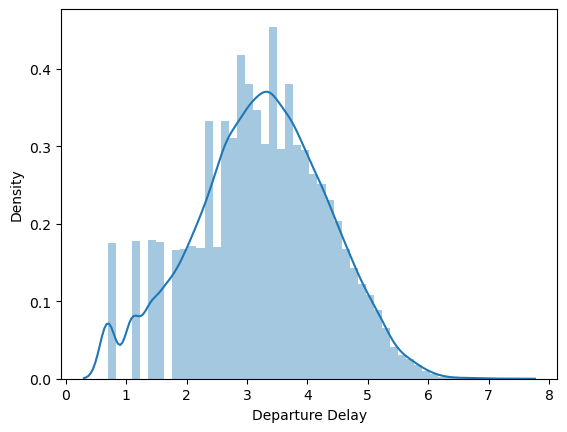

In [142]:
sns.distplot(df['Departure Delay'])

In [143]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,0.693147,1.609438,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,3.258097,3.663562,2,...,5,4,5,5,3,5,2,5,5,Satisfied
11,12,Female,27,First-time,Business,Business,421,2.995732,3.044522,2,...,2,2,5,1,1,3,1,1,4,Neutral or Dissatisfied
12,13,Male,24,First-time,Business,Economy,453,2.772589,3.401197,2,...,2,5,4,5,5,4,2,5,4,Neutral or Dissatisfied
13,14,Male,9,Returning,Personal,Business,853,4.219508,4.330733,5,...,4,5,3,5,5,5,1,5,4,Neutral or Dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129865,129866,Male,64,Returning,Business,Economy Plus,337,3.295837,2.890372,3,...,1,2,2,2,2,3,2,2,3,Neutral or Dissatisfied
129870,129871,Female,23,First-time,Business,Business,337,3.828641,4.060443,2,...,2,5,1,5,5,4,2,5,4,Neutral or Dissatisfied
129875,129876,Male,28,Returning,Personal,Economy Plus,447,0.693147,1.098612,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,1.791759,2.639057,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied


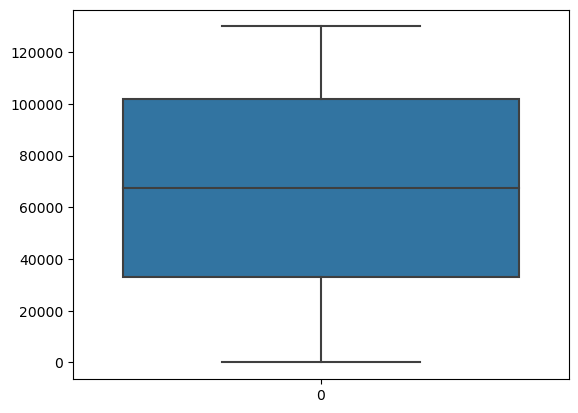

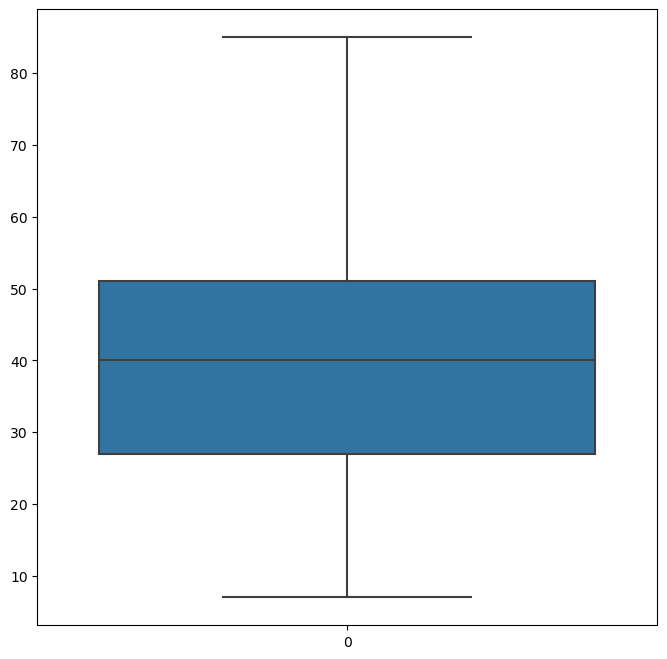

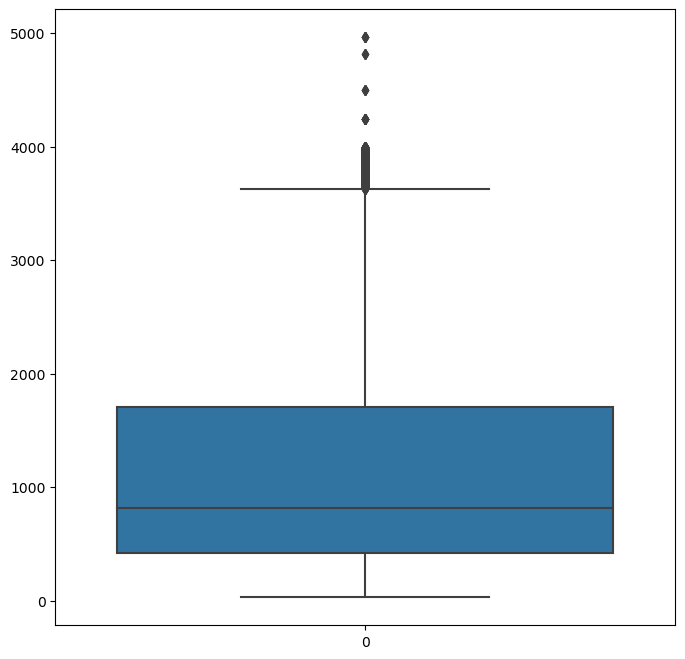

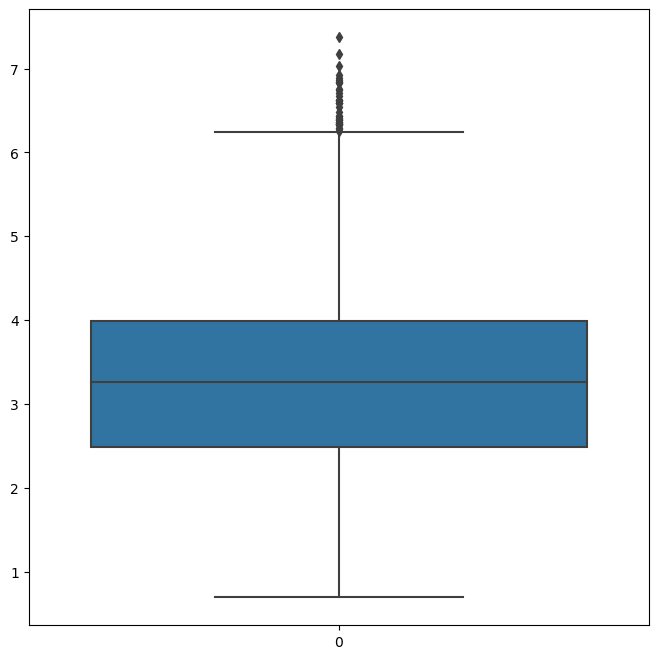

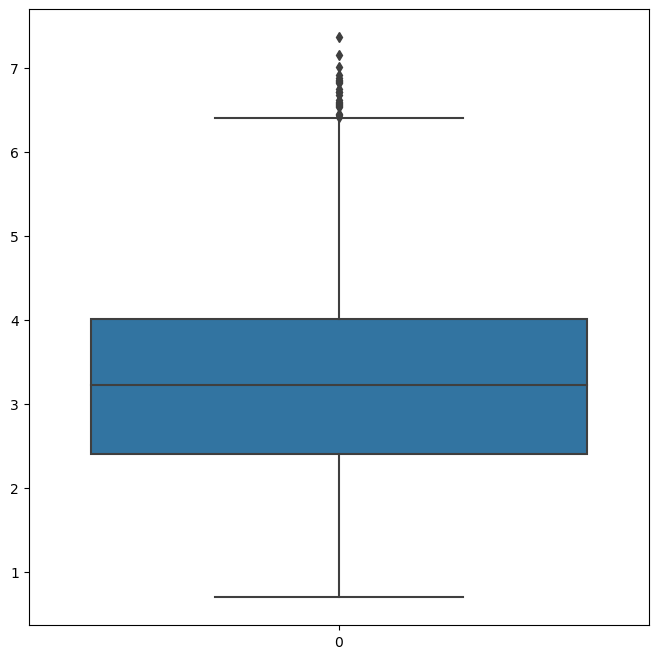

...

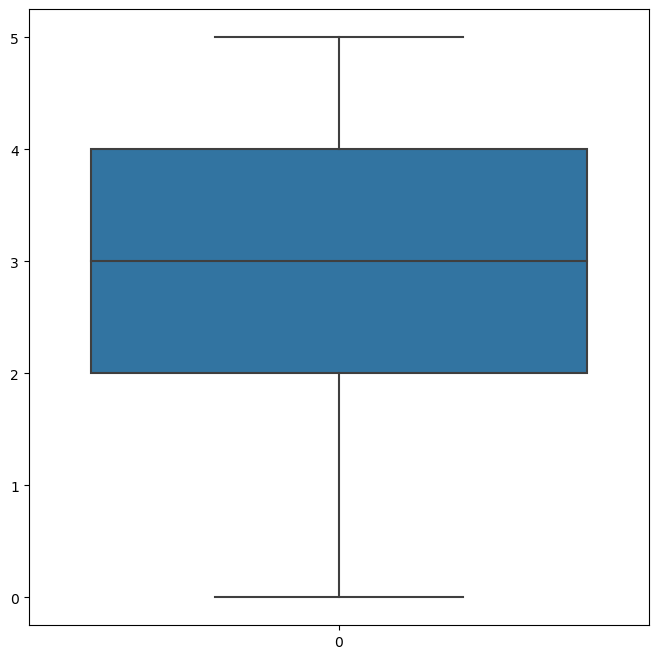

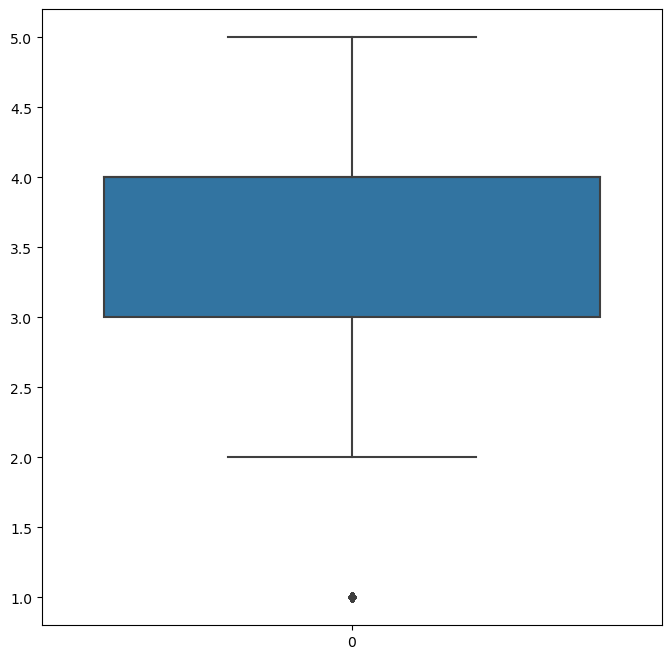

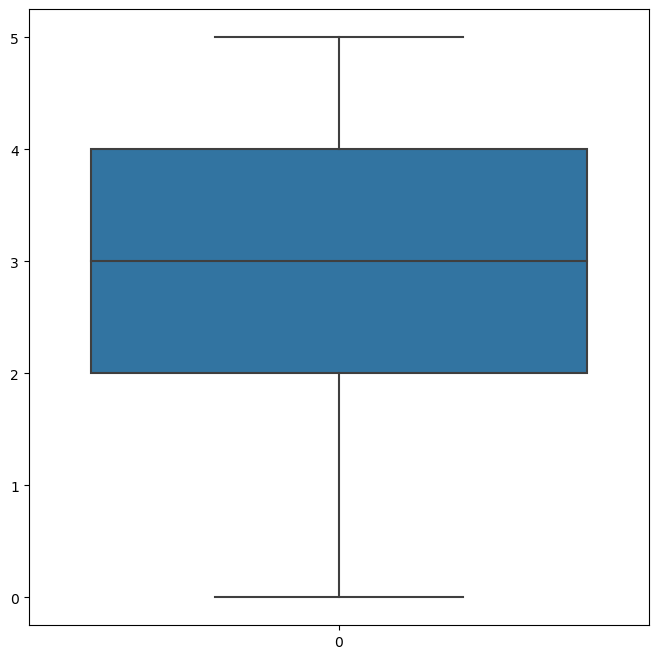

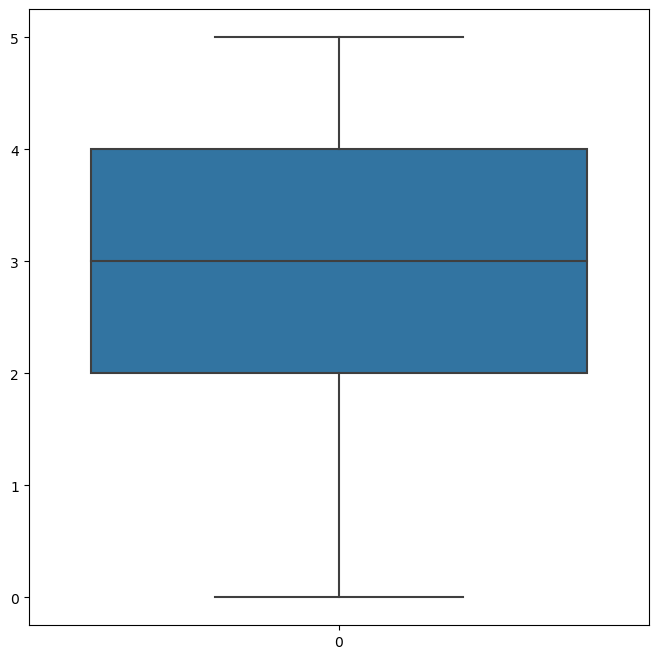

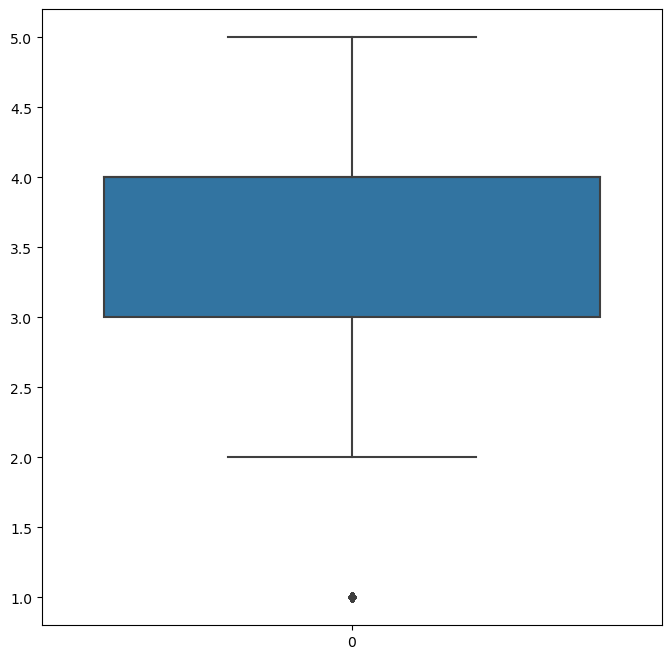

<Figure size 800x800 with 0 Axes>

In [144]:
for col in number_df:
    sns.boxplot(df[col])
    plt.figure(figsize=(8,8))

In [145]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,0.693147,1.609438,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,3.258097,3.663562,2,...,5,4,5,5,3,5,2,5,5,Satisfied
11,12,Female,27,First-time,Business,Business,421,2.995732,3.044522,2,...,2,2,5,1,1,3,1,1,4,Neutral or Dissatisfied
12,13,Male,24,First-time,Business,Economy,453,2.772589,3.401197,2,...,2,5,4,5,5,4,2,5,4,Neutral or Dissatisfied
13,14,Male,9,Returning,Personal,Business,853,4.219508,4.330733,5,...,4,5,3,5,5,5,1,5,4,Neutral or Dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129865,129866,Male,64,Returning,Business,Economy Plus,337,3.295837,2.890372,3,...,1,2,2,2,2,3,2,2,3,Neutral or Dissatisfied
129870,129871,Female,23,First-time,Business,Business,337,3.828641,4.060443,2,...,2,5,1,5,5,4,2,5,4,Neutral or Dissatisfied
129875,129876,Male,28,Returning,Personal,Economy Plus,447,0.693147,1.098612,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,1.791759,2.639057,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied


In [146]:
def remove_outliers(df):
    for col in df.columns:
        if df[col].dtype in ['int64', 'float64']:  # Ensure we process only numeric columns
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # Filtering the data for outliers
            df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df


In [147]:
df=remove_outliers(df)


In [148]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,0.693147,1.609438,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,3.258097,3.663562,2,...,5,4,5,5,3,5,2,5,5,Satisfied
11,12,Female,27,First-time,Business,Business,421,2.995732,3.044522,2,...,2,2,5,1,1,3,1,1,4,Neutral or Dissatisfied
12,13,Male,24,First-time,Business,Economy,453,2.772589,3.401197,2,...,2,5,4,5,5,4,2,5,4,Neutral or Dissatisfied
13,14,Male,9,Returning,Personal,Business,853,4.219508,4.330733,5,...,4,5,3,5,5,5,1,5,4,Neutral or Dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129865,129866,Male,64,Returning,Business,Economy Plus,337,3.295837,2.890372,3,...,1,2,2,2,2,3,2,2,3,Neutral or Dissatisfied
129870,129871,Female,23,First-time,Business,Business,337,3.828641,4.060443,2,...,2,5,1,5,5,4,2,5,4,Neutral or Dissatisfied
129875,129876,Male,28,Returning,Personal,Economy Plus,447,0.693147,1.098612,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,1.791759,2.639057,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied


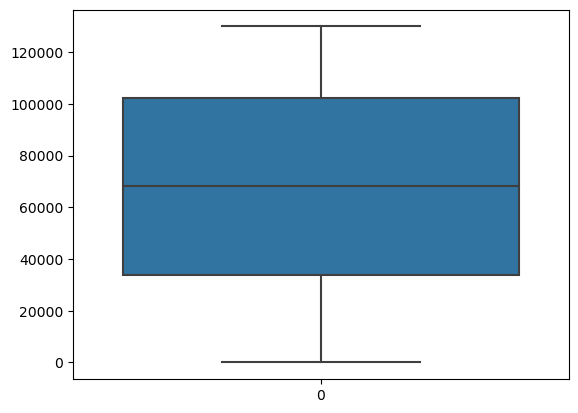

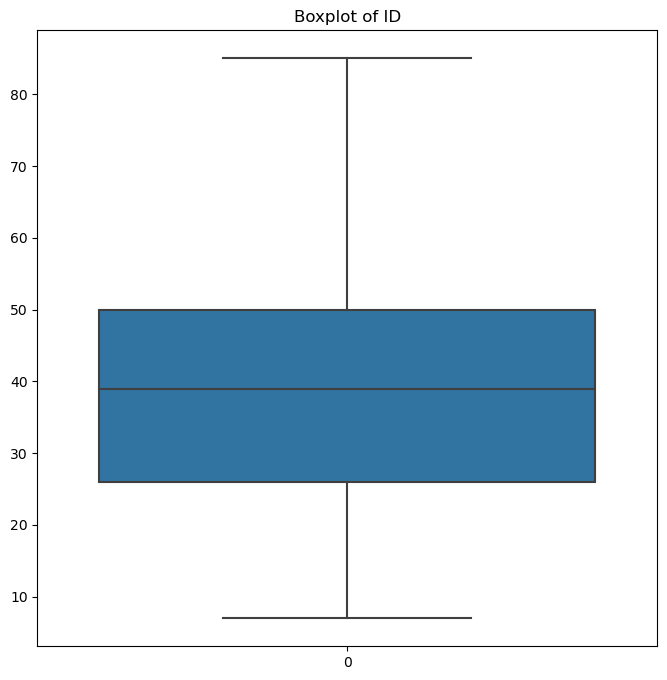

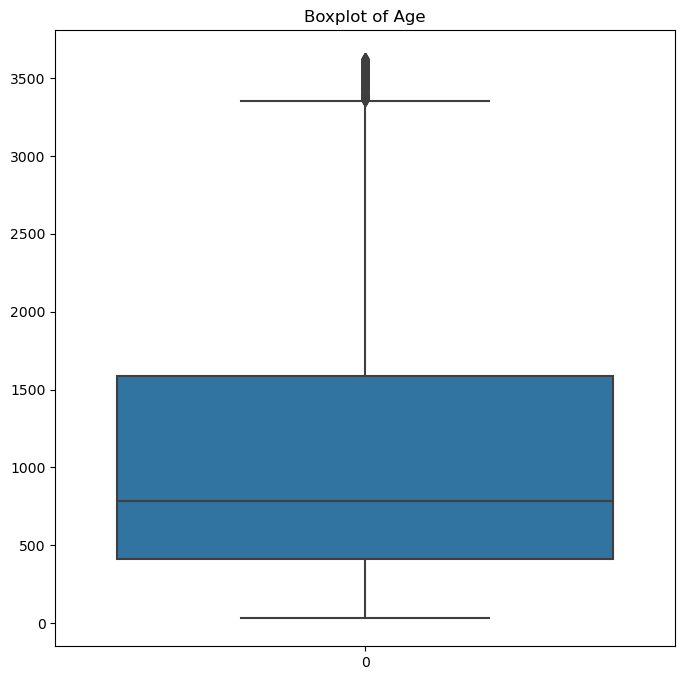

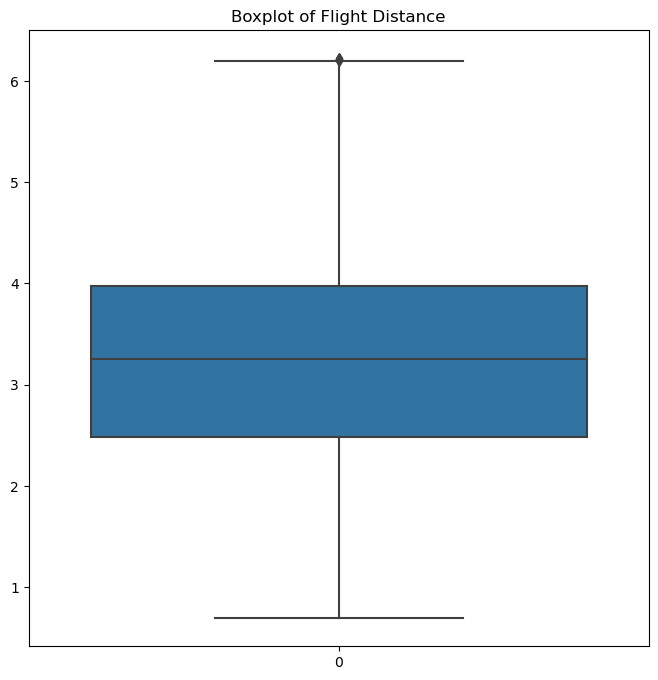

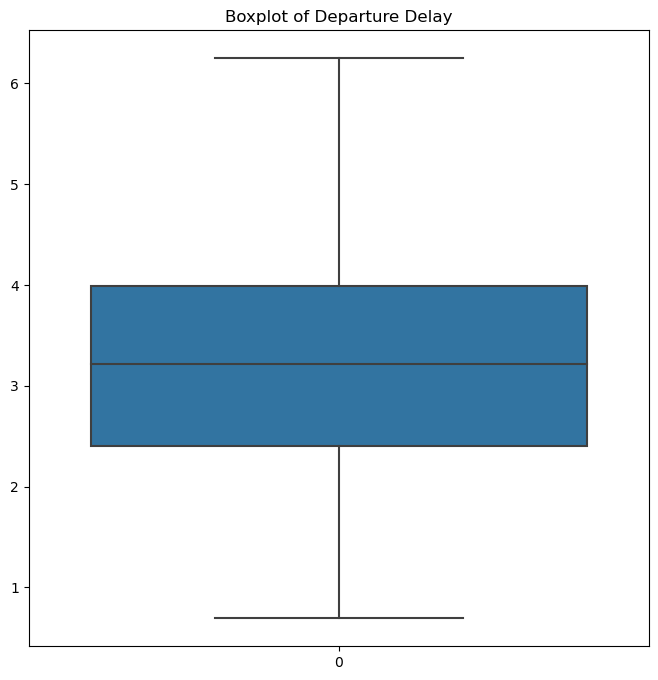

...

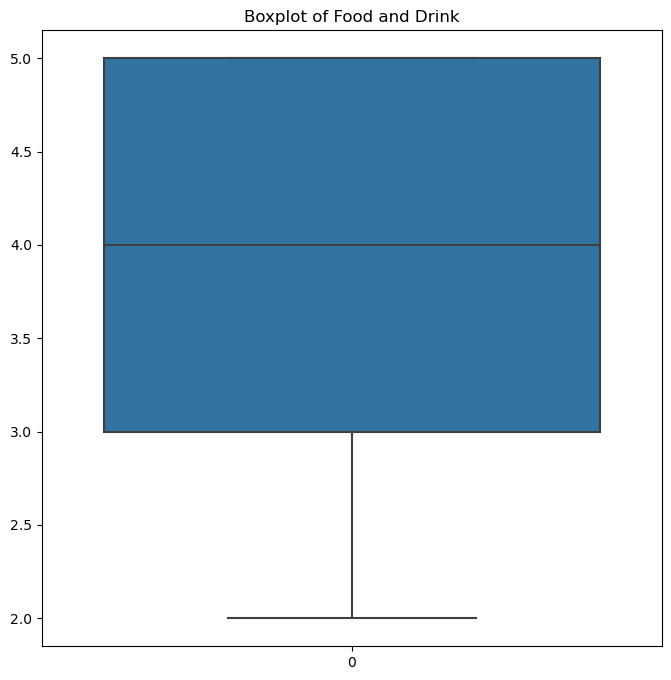

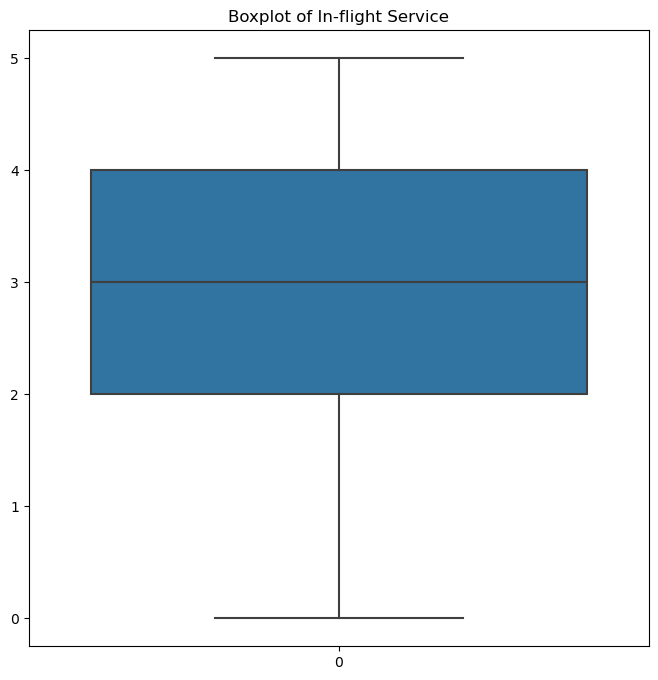

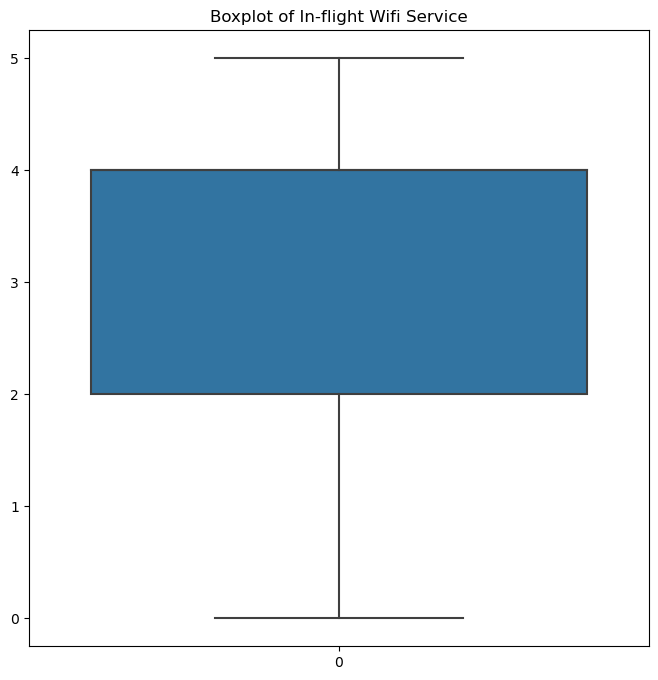

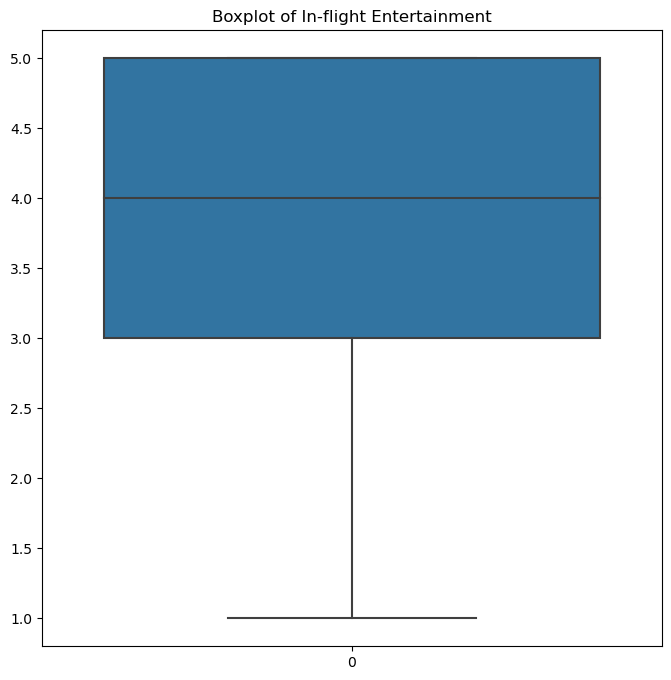

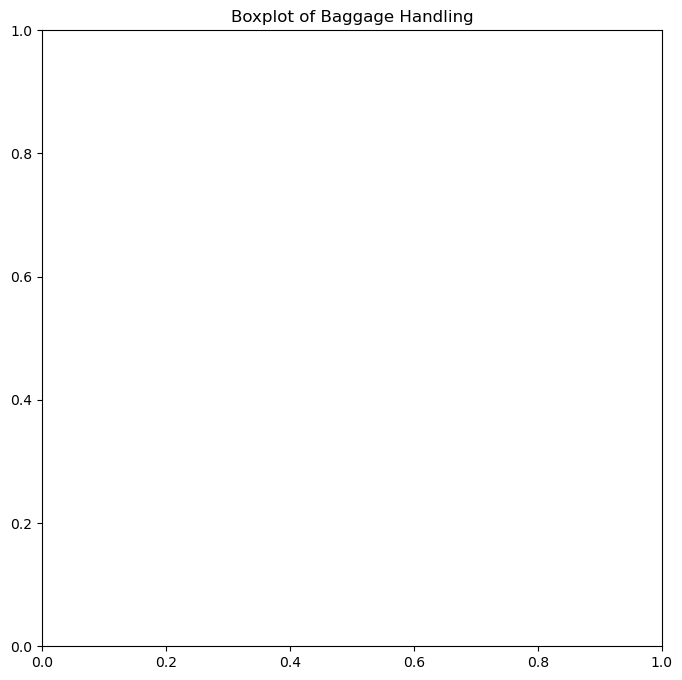

In [149]:
for col in number_df:
    sns.boxplot(df[col])
    plt.figure(figsize=(8,8))
    plt.title(f'Boxplot of {col}')  # Add a title to the boxplot


In [150]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,0.693147,1.609438,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,3.258097,3.663562,2,...,5,4,5,5,3,5,2,5,5,Satisfied
11,12,Female,27,First-time,Business,Business,421,2.995732,3.044522,2,...,2,2,5,1,1,3,1,1,4,Neutral or Dissatisfied
12,13,Male,24,First-time,Business,Economy,453,2.772589,3.401197,2,...,2,5,4,5,5,4,2,5,4,Neutral or Dissatisfied
13,14,Male,9,Returning,Personal,Business,853,4.219508,4.330733,5,...,4,5,3,5,5,5,1,5,4,Neutral or Dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129865,129866,Male,64,Returning,Business,Economy Plus,337,3.295837,2.890372,3,...,1,2,2,2,2,3,2,2,3,Neutral or Dissatisfied
129870,129871,Female,23,First-time,Business,Business,337,3.828641,4.060443,2,...,2,5,1,5,5,4,2,5,4,Neutral or Dissatisfied
129875,129876,Male,28,Returning,Personal,Economy Plus,447,0.693147,1.098612,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,1.791759,2.639057,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied


C:\Users\himan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\h

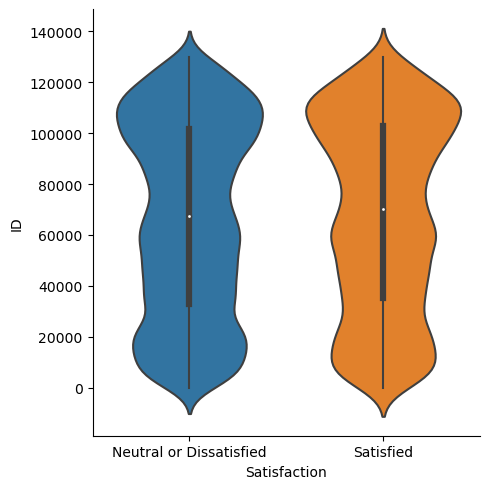

<Figure size 1500x1000 with 0 Axes>

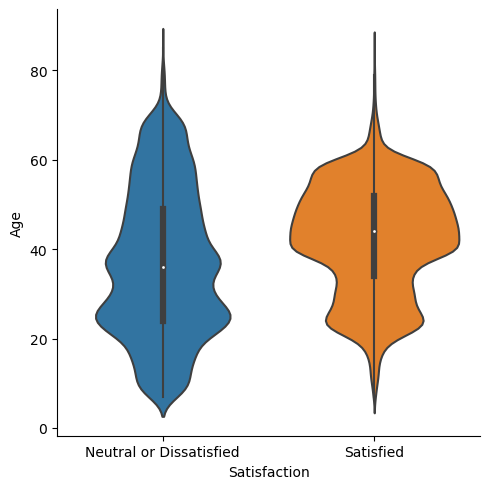

<Figure size 1500x1000 with 0 Axes>

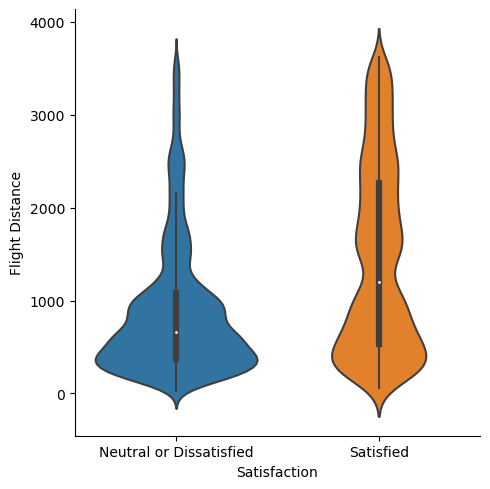

<Figure size 1500x1000 with 0 Axes>

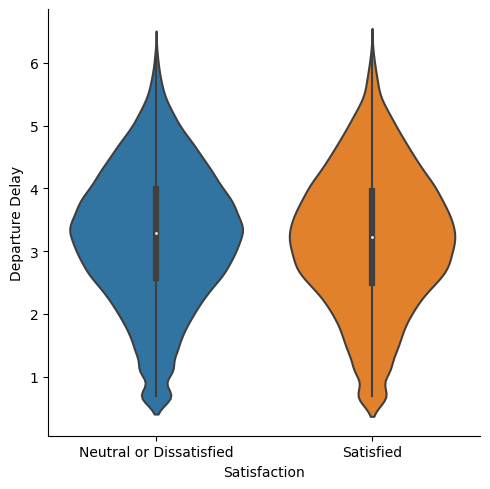

<Figure size 1500x1000 with 0 Axes>

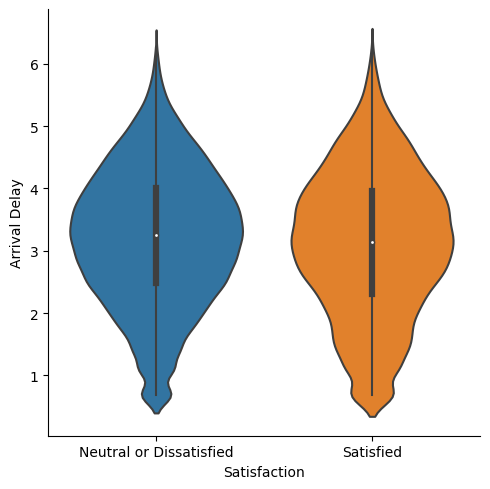

<Figure size 1500x1000 with 0 Axes>

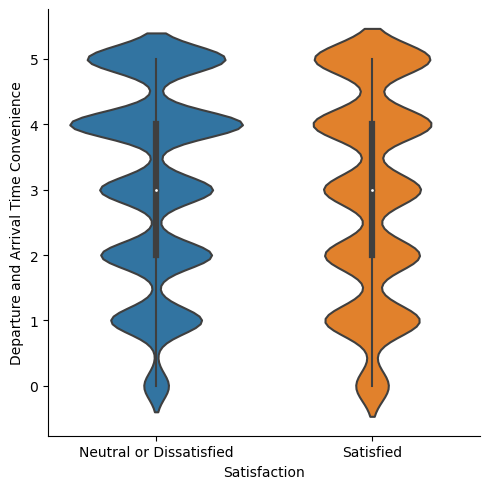

<Figure size 1500x1000 with 0 Axes>

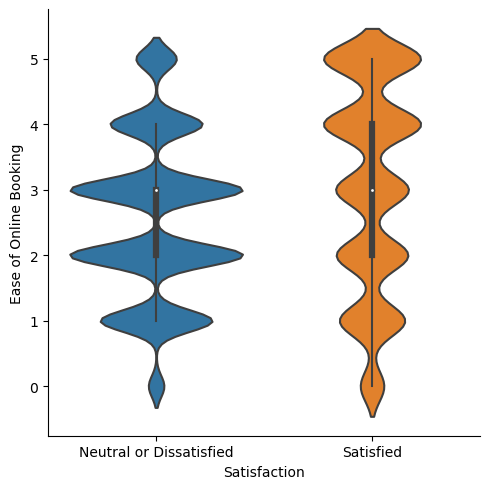

<Figure size 1500x1000 with 0 Axes>

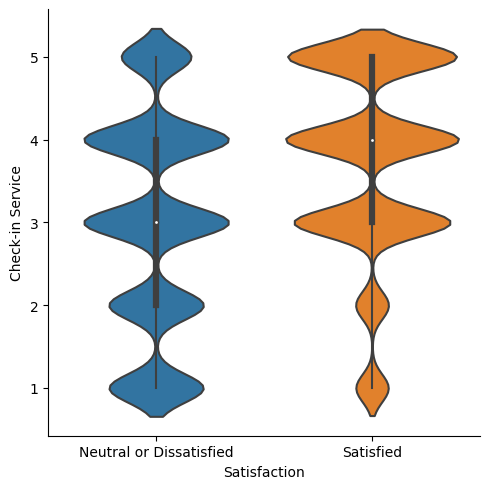

<Figure size 1500x1000 with 0 Axes>

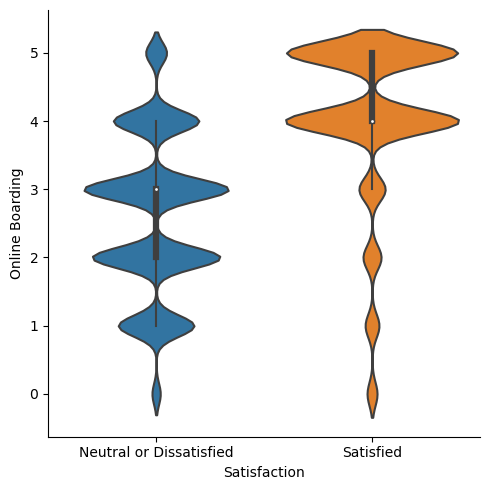

<Figure size 1500x1000 with 0 Axes>

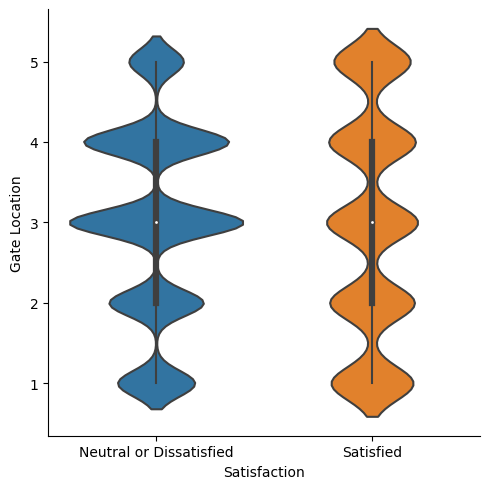

<Figure size 1500x1000 with 0 Axes>

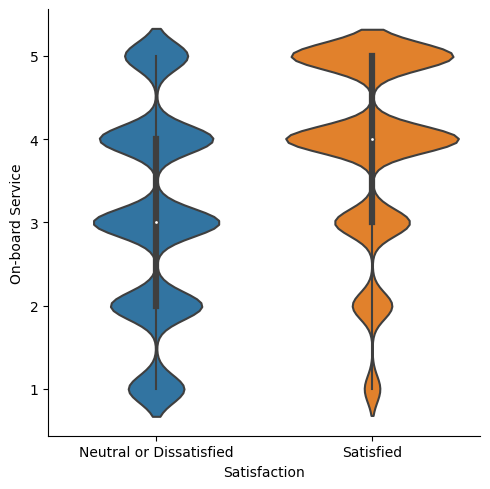

<Figure size 1500x1000 with 0 Axes>

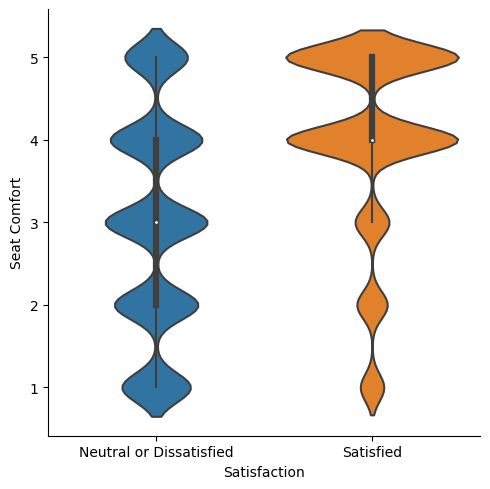

<Figure size 1500x1000 with 0 Axes>

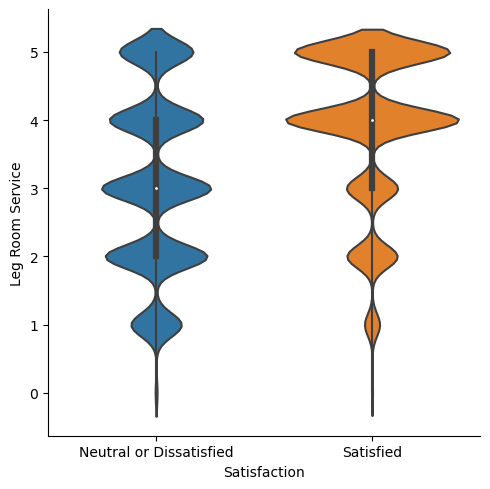

<Figure size 1500x1000 with 0 Axes>

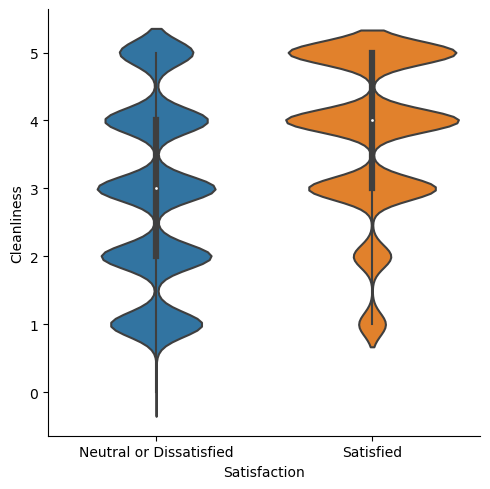

<Figure size 1500x1000 with 0 Axes>

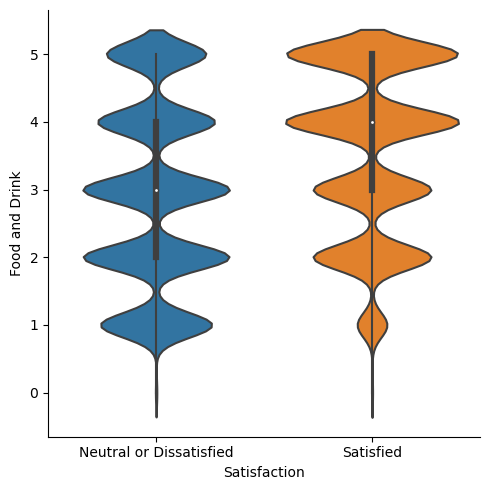

<Figure size 1500x1000 with 0 Axes>

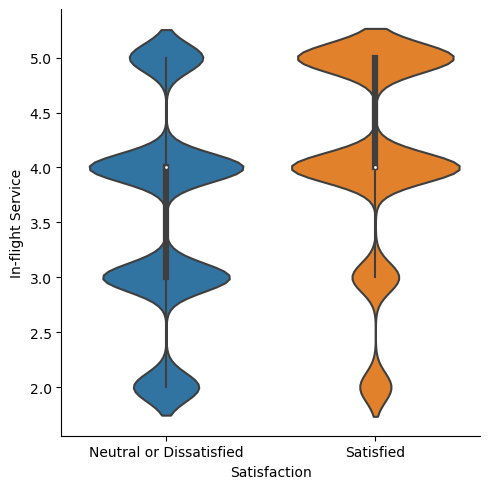

<Figure size 1500x1000 with 0 Axes>

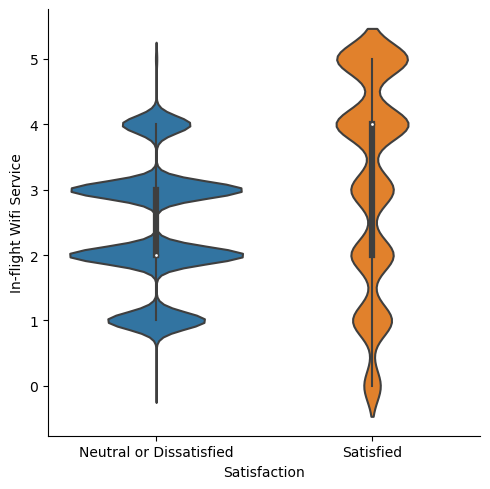

<Figure size 1500x1000 with 0 Axes>

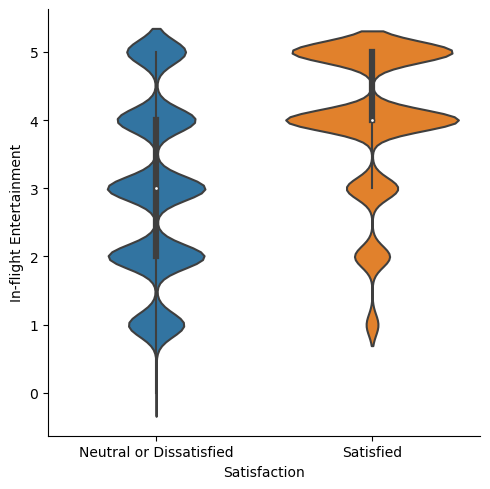

<Figure size 1500x1000 with 0 Axes>

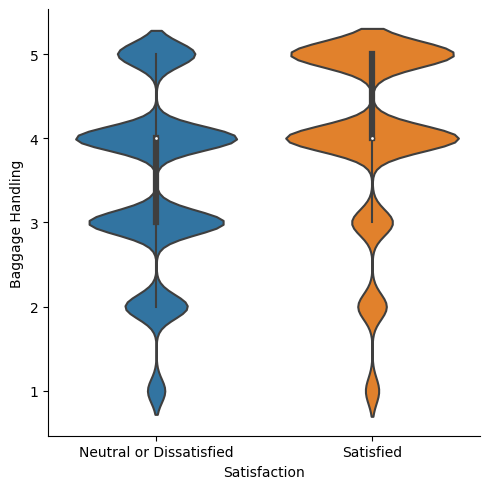

<Figure size 1500x1000 with 0 Axes>

In [151]:
for col in number_df:
    sns.catplot(data=df,x='Satisfaction',y=col,kind='violin')
    plt.figure(figsize=(15,10))

C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\himan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

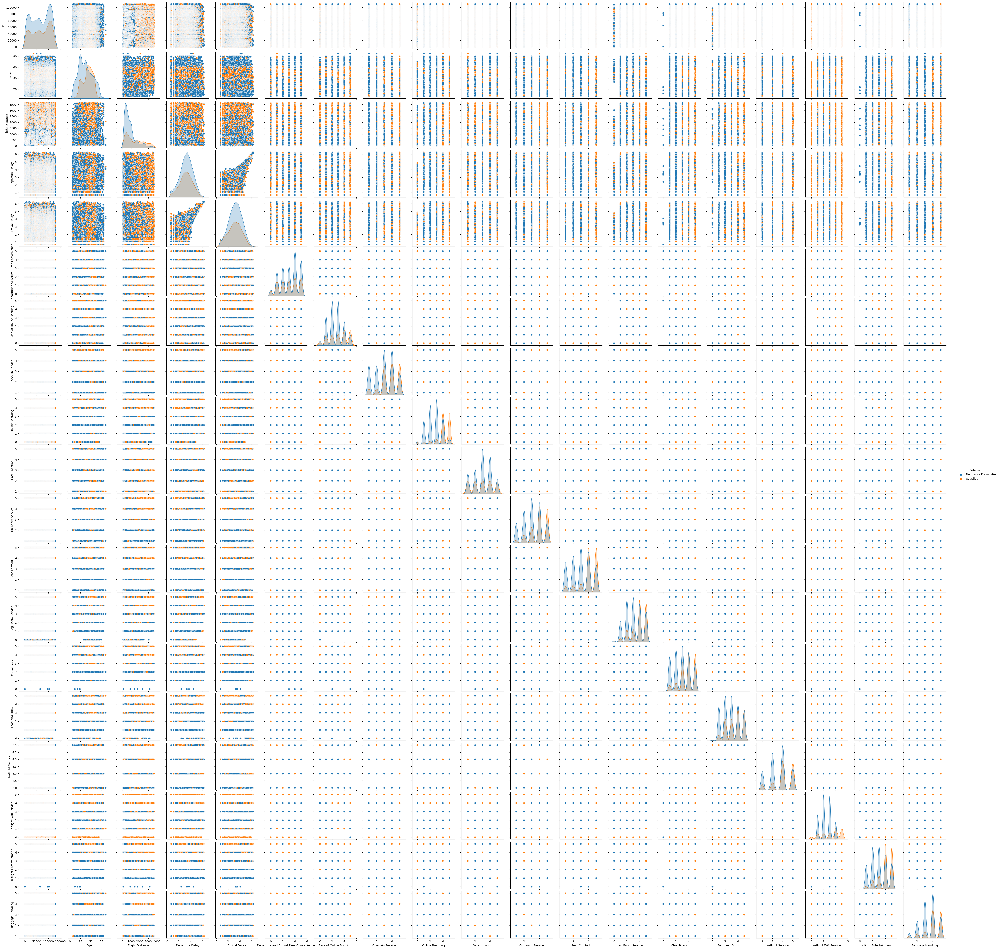

In [152]:
sns.pairplot(data=df,hue='Satisfaction')

In [153]:
le=LabelEncoder()

for col in df.columns:
    if df[col].dtype == 'object':  # Ensure we process only object columns
        df[col]=le.fit_transform(df[col])
        

In [154]:
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,1,48,0,0,0,821,0.693147,1.609438,3,...,3,5,2,5,5,5,3,5,5,0
1,2,0,35,1,0,0,821,3.258097,3.663562,2,...,5,4,5,5,3,5,2,5,5,1
11,12,0,27,0,0,0,421,2.995732,3.044522,2,...,2,2,5,1,1,3,1,1,4,0
12,13,1,24,0,0,1,453,2.772589,3.401197,2,...,2,5,4,5,5,4,2,5,4,0
13,14,1,9,1,1,0,853,4.219508,4.330733,5,...,4,5,3,5,5,5,1,5,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129865,129866,1,64,1,0,2,337,3.295837,2.890372,3,...,1,2,2,2,2,3,2,2,3,0
129870,129871,0,23,0,0,0,337,3.828641,4.060443,2,...,2,5,1,5,5,4,2,5,4,0
129875,129876,1,28,1,1,2,447,0.693147,1.098612,4,...,5,1,4,4,4,5,4,4,4,0
129877,129878,1,42,1,1,2,337,1.791759,2.639057,5,...,3,3,4,3,3,4,2,3,5,0


In [155]:
X=df.drop(['ID','Satisfaction'],axis=1)

In [156]:
y=df['Satisfaction']

In [157]:
sc=StandardScaler()


In [158]:
X=sc.fit_transform(X)


In [159]:
X

array([[ 1.00192472,  0.60143928, -2.01992586, ...,  0.24249748,
         1.26943464,  1.21160951],
       [-0.99807898, -0.255028  ,  0.49506768, ..., -0.54605797,
         1.26943464,  1.21160951],
       [-0.99807898, -0.7820848 , -2.01992586, ..., -1.33461343,
        -1.82175408,  0.28079803],
       ...,
       [ 1.00192472, -0.7162027 ,  0.49506768, ...,  1.03105294,
         0.49663746,  0.28079803],
       [ 1.00192472,  0.20614669,  0.49506768, ..., -0.54605797,
        -0.27615972,  1.21160951],
       [ 1.00192472,  0.73320348,  0.49506768, ...,  1.8196084 ,
        -0.27615972,  1.21160951]])

In [160]:
 X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [161]:
X_train.shape

(29123, 22)

In [162]:
y_train.shape

(29123,)

In [163]:
X_test.shape

(7281, 22)

In [164]:
y_test.shape

(7281,)

In [165]:
rfc=RandomForestClassifier()

In [166]:
rfc.fit(X_train,y_train)

RandomForestClassifier()

In [167]:
y_pred=rfc.predict(X_test)


In [168]:
accuracy_score(y_test,y_pred)

0.9656640571350089

In [169]:
cm=confusion_matrix(y_test,y_pred)

In [170]:
cm

array([[4465,   77],
       [ 173, 2566]], dtype=int64)

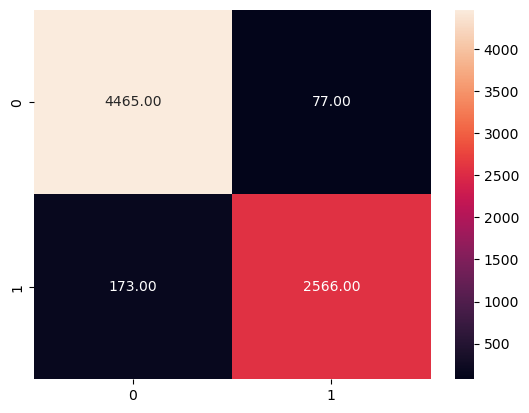

In [171]:
sns.heatmap(cm,annot=True,fmt='1.2f')
plt.show()

In [172]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      4542
           1       0.97      0.94      0.95      2739

    accuracy                           0.97      7281
   macro avg       0.97      0.96      0.96      7281
weighted avg       0.97      0.97      0.97      7281

